In [1]:
# conda activate bio

# Data manipulation/operation 
import pandas as pd 
import numpy as np
from scipy import stats
from evcouplings.align import Alignment, map_matrix

# Data viz
import matplotlib.pyplot as plt 
from matplotlib.patches import Patch
import seaborn as sns
from matplotlib import cm
from mpl_sankey import sankey
from biokit.viz import corrplot
from psynlig import plot_correlation_heatmap

# interactive viz
import plotly.express as px
import holoviews as hv
hv.extension('bokeh') 

ModuleNotFoundError: No module named 'biokit'

This notebook shows a simple EDA on functional datasets (mics and kinetics)

# MICs

## data 

In [5]:
df_mics = pd.read_pickle("../results/mics/training_dset_mics.pkl")

# subsets by bla class
df_mics_a = df_mics[df_mics.bla_class.str.contains("Class A")]
df_mics_b = df_mics[df_mics.bla_class.str.contains("Class B")]
df_mics_c = df_mics[df_mics.bla_class.str.contains("Class C")]
df_mics_d = df_mics[df_mics.bla_class.str.contains("Class D")]

# subsets by anti class
df_mics_peni = df_mics[df_mics.antibiotic_class.str.contains("Penicillins")]
df_mics_ceph = df_mics[df_mics.antibiotic_class.str.contains("Cephalosporins")]
df_mics_carb = df_mics[df_mics.antibiotic_class.str.contains("Carbapenems")]
df_mics_mono = df_mics[df_mics.antibiotic_class.str.contains("Monobactams")]

# subset by serin blas 
df_mics_sbl = df_mics[df_mics.bla_class.str.contains("Class A|Class C|Class D")]

df_mics.groupby(["antibiotic", "antibiotic_class"]).count().sort_values("protein_name", ascending = False).iloc[:, [0]]

,,protein_name
antibiotic,antibiotic_class,
Ceftazidime,Cephalosporins,207
Cefotaxime,Cephalosporins,196
Imipenem,Carbapenems,194
Aztreonam,Monobactams,191
Cefepime,Cephalosporins,165
Cefoxitin,Cephalosporins,153
Piperacillin,Penicillins,150
Piperacillin-TZB,Penicillins,126
Amoxicillin-CLA,Penicillins,107


## barplots

In [18]:
def do_barplots(dset, bla_class, title, color):
    
    # set fig grid
    mosaic = """
        ABC
        ABC
        DDD
    """
    
    # plot 
    ax = plt.figure(figsize=(22,10), constrained_layout = True).subplot_mosaic(mosaic) 
    
    # antibiotic
    sns.countplot(data = dset, y = "antibiotic", hue = "antibiotic_class", 
                  dodge=False, order = pd.value_counts(dset["antibiotic"]).index, ax = ax["A"])
    ax["A"].set_title(f"{len(dset.antibiotic.unique())} Antibiotics in {bla_class}")
    ax["A"].grid(which='major', color='grey', linewidth=1, alpha=0.1, linestyle = "--")
    ax["A"].set_ylabel("")
    
    # antibiotic class
    sns.countplot(data = dset, y = "antibiotic_class", color = color,
                  order = pd.value_counts(dset["antibiotic_class"]).index, ax = ax["B"])
    ax["B"].set_title(f"{len(dset.antibiotic_class.value_counts())} Antibiotic classes \n in {bla_class}")
    ax["B"].grid(which='major', color='grey', linewidth=1, alpha=0.1, linestyle = "--")
    ax["B"].set_ylabel("")

    # protein fams
    sns.countplot(data = dset, y = "protein_family_header", color = color,
                  order = pd.value_counts(dset["protein_family_header"]).index, ax = ax["C"])
    ax["C"].set_title(f"{len(dset.protein_family_header.value_counts())} Protein families {bla_class}")
    ax["C"].grid(which='major', color='grey', linewidth=1, alpha=0.1, linestyle = "--")
    ax["C"].set_ylabel("")
    ax["C"].bar_label(ax["C"].containers[0])
    
    # unique proteins
    sns.countplot(data = dset, x = "protein_name",  color = color,
                  order = pd.value_counts(dset["protein_name"]).index, ax = ax["D"])
    ax["D"].set_title(f"{len(dset.protein_name.value_counts())} unique proteins in {bla_class}")
    size = len(dset.protein_name.value_counts())
    ax["D"].set_xticklabels(ax["D"].get_xticklabels(), rotation=90)
    ax["D"].grid(which='major', color='grey', linestyle = "--", linewidth=1, alpha=0.1)
    if len(dset.protein_name.value_counts()) > 120:
        ax["D"].xaxis.set_tick_params(labelsize=6)
    
    # set title
    plt.suptitle(title,fontsize=20)

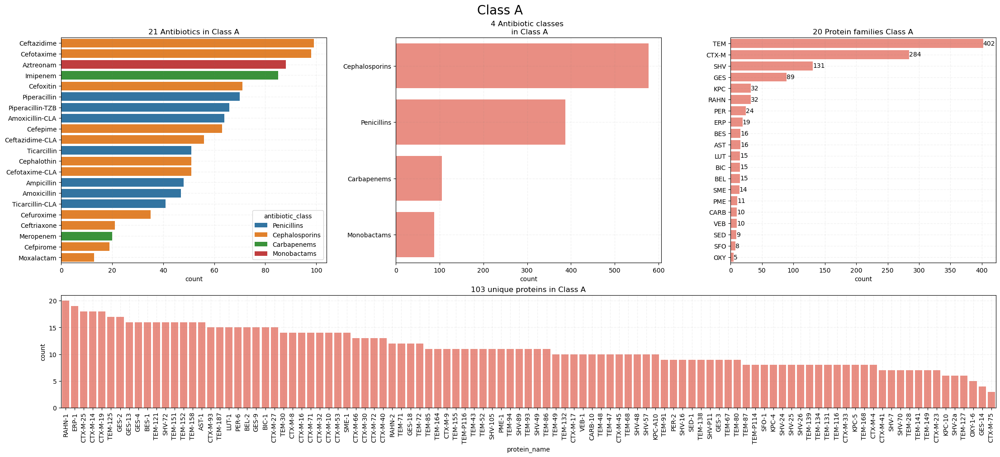

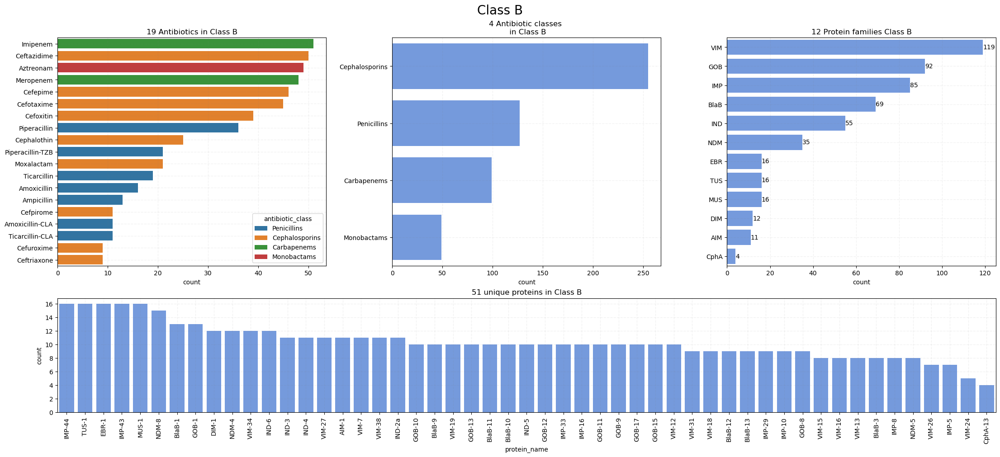

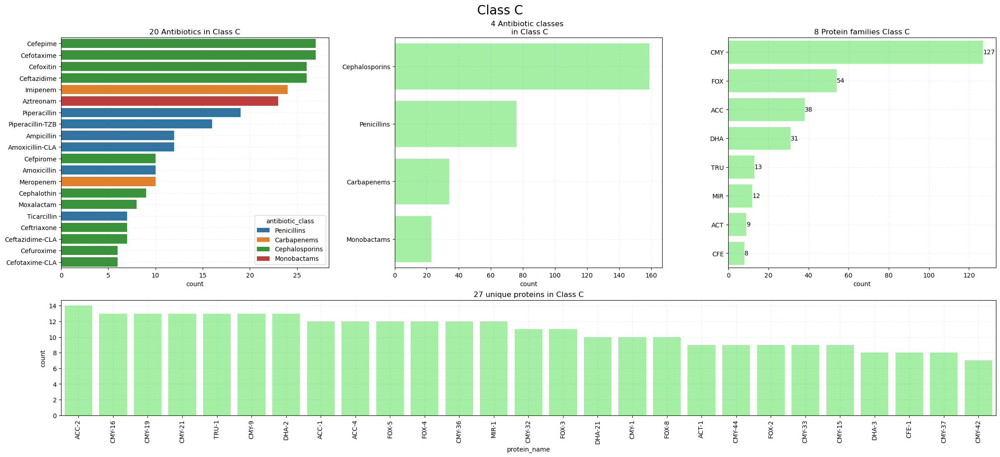

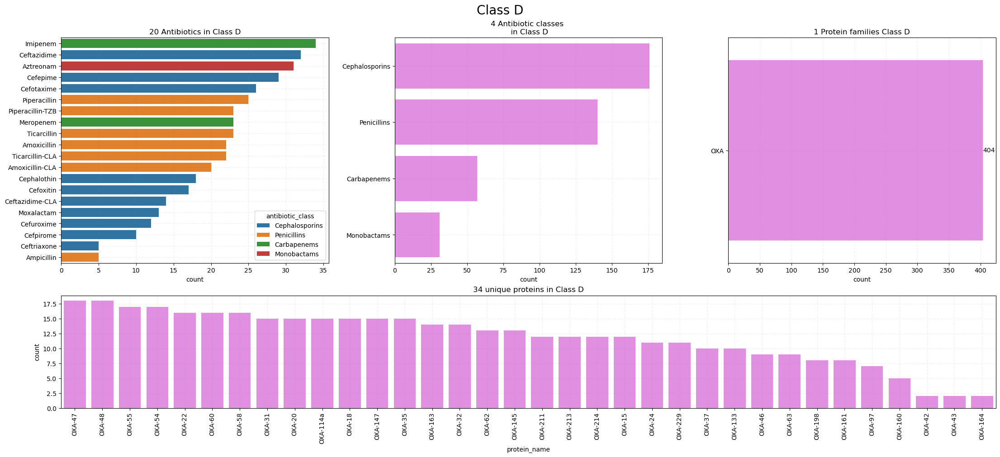

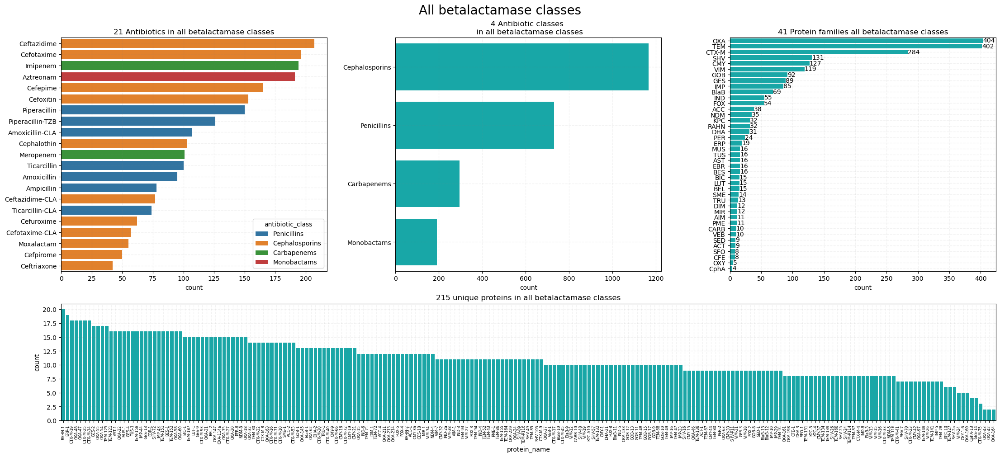

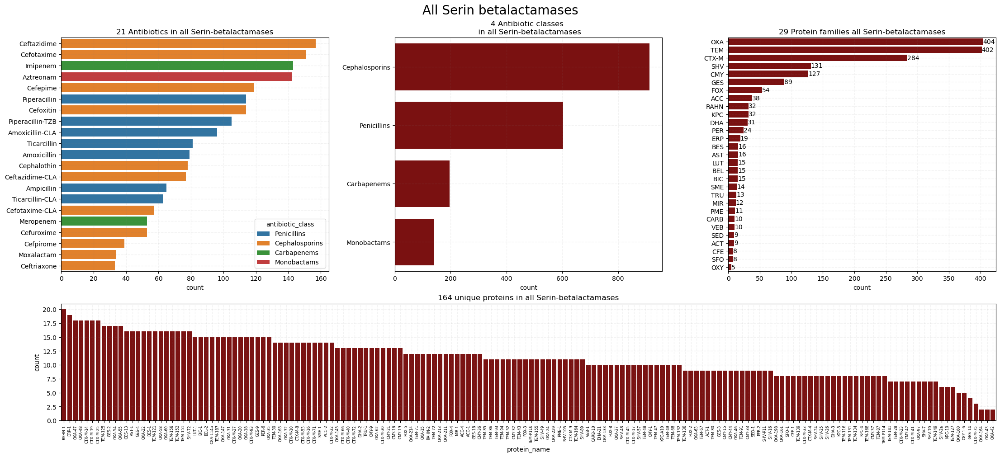

In [5]:
do_barplots(df_mics_a, "Class A", "Class A", "salmon")
do_barplots(df_mics_b, "Class B", "Class B", "cornflowerblue")
do_barplots(df_mics_c, "Class C", "Class C", "palegreen")
do_barplots(df_mics_d, "Class D", "Class D", "violet")
do_barplots(df_mics, "all betalactamase classes", "All betalactamase classes", "c")
do_barplots(df_mics_sbl, "all Serin-betalactamases", "All Serin betalactamases", "darkred")

In [6]:
df_mics_c.protein_family_header.nunique()

8

In [7]:
df_mics.protein_name.nunique()

215

In [8]:
len(df_mics)

2383

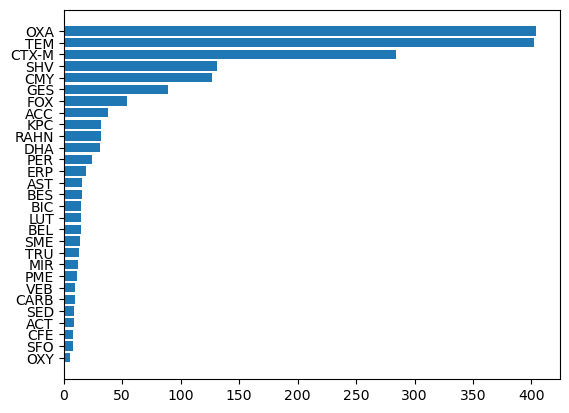

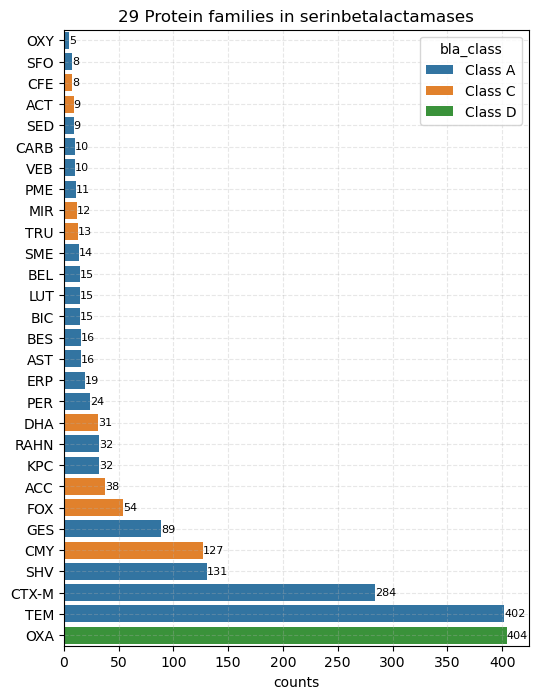

In [19]:
sbl_fam_count = df_mics_sbl[["protein_family_header", "bla_class", "seq_id"]]
sbl_fam_count = sbl_fam_count.groupby(["protein_family_header", "bla_class"]).count().reset_index()
sbl_fam_count = sbl_fam_count.rename(columns = {"protein_family_header":"name", "seq_id":"counts"})
sbl_fam_count = sbl_fam_count.sort_values("counts")


bars = plt.barh(sbl_fam_count['name'], sbl_fam_count['counts'])
plt.figure(figsize=(6, 8))
ax = sns.barplot(data = sbl_fam_count, y = "name", x = "counts", hue = "bla_class", dodge = False)
ax.bar_label(bars, fontsize=8)
plt.grid(alpha=0.3, linestyle="--")
plt.ylabel("")
plt.title(f"{len(sbl_fam_count.name.value_counts())} Protein families in serinbetalactamases");

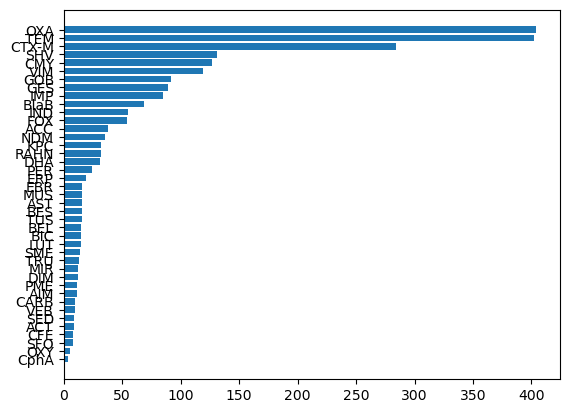

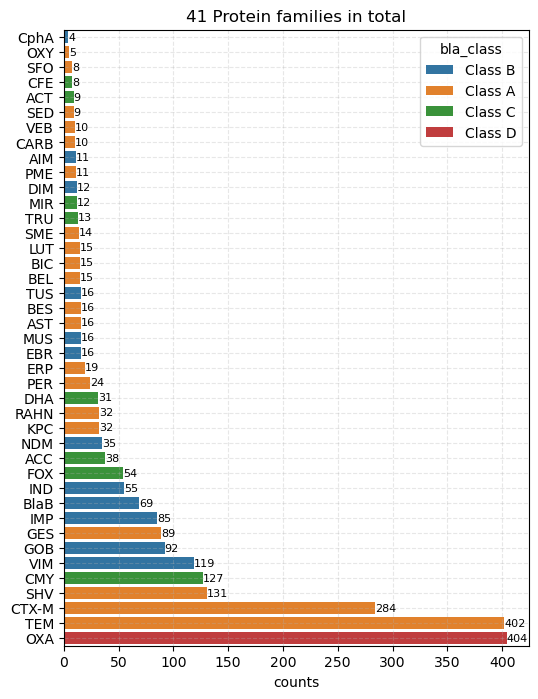

In [20]:
all_fam_count = df_mics[["protein_family_header", "bla_class", "seq_id"]]
all_fam_count = all_fam_count.groupby(["protein_family_header", "bla_class"]).count().reset_index()
all_fam_count = all_fam_count.rename(columns = {"protein_family_header":"name", "seq_id":"counts"})
all_fam_count = all_fam_count.sort_values("counts")


bars = plt.barh(all_fam_count['name'], all_fam_count['counts']);
plt.figure(figsize=(6, 8))
ax = sns.barplot(data = all_fam_count, y = "name", x = "counts", hue = "bla_class", dodge = False, width=0.8)
ax.bar_label(bars, fontsize=8)
plt.grid(alpha=0.3, linestyle="--")
plt.ylabel("")
plt.title(f"{len(all_fam_count.name.value_counts())} Protein families in total");

In [29]:
rep_enzyme = ["ACT","CARB","SME","KPC","NDM","FOX",
              "IND","IMP","GOB","VIM","CMY","SHV",
              "CTX-M","TEM","OXA",]

all_fam_count[~all_fam_count.name.isin(rep_enzyme)]["counts"].sum()

530

In [30]:
all_fam_count[all_fam_count.name.isin(rep_enzyme)]["counts"].sum()

1853

## sankey of antibiotics 

In [3]:
# take a subset
df_sub = df_mics[["protein_name", "antibiotic", "antibiotic_class", "bla_class"]]
df_sub_sbl = df_mics_sbl[["protein_name", "antibiotic", "antibiotic_class", "bla_class"]]
# subset_grouped.add_suffix('_Count').reset_index()

# group by counts
subset_grouped = df_sub.groupby(["bla_class", "antibiotic_class", "antibiotic"]).count()
subset_grouped_sbl = df_sub_sbl.groupby(["bla_class", "antibiotic_class", "antibiotic"]).count()

# https://coderzcolumn.com/tutorials/data-science/how-to-plot-sankey-diagram-in-python-jupyter-notebook-holoviews-and-plotly 
fig = hv.Sankey(subset_grouped, kdims=["bla_class", "antibiotic_class"], vdims=["protein_name"])
fig.opts(
    cmap = 'Pastel1', label_position = 'outer', edge_color = "bla_class", 
    edge_line_width = 0, node_width = 50, width = 800, height = 600, 
    title = "Classes of antibiotics contained in each betalactamase class")

:Sankey   [bla_class,antibiotic_class]   (protein_name)

In [4]:
fig = hv.Sankey(subset_grouped, kdims=["antibiotic_class", "antibiotic"], vdims=["protein_name"])
fig.opts(
    cmap = 'Pastel1', label_position = 'outer', edge_color = "antibiotic_class", 
    edge_line_width = 0, node_width = 50, width = 800, height = 600, 
    title = "Antibiotic classes contained in each antibiotic class")

:Sankey   [antibiotic_class,antibiotic]   (protein_name)

In [5]:
fig = hv.Sankey(subset_grouped_sbl, kdims=["bla_class", "antibiotic_class"], vdims=["protein_name"])
fig.opts(
    cmap = 'Pastel1', label_position = 'outer', edge_color = "bla_class", 
    edge_line_width = 0, node_width = 50, width = 800, height = 600, 
    title = "Classes of antibiotics contained in serin-betalactamases")

:Sankey   [bla_class,antibiotic_class]   (protein_name)

In [6]:
fig = hv.Sankey(subset_grouped_sbl, kdims=["antibiotic_class", "antibiotic"], vdims=["protein_name"])
fig.opts(
    cmap = 'Pastel1', label_position = 'outer', edge_color = "antibiotic_class", 
    edge_line_width = 0, node_width = 50, width = 800, height = 600, 
    title = "Antibiotic classes contained in serin-betalactamases")

:Sankey   [antibiotic_class,antibiotic]   (protein_name)

In [7]:
fig = hv.Sankey(subset_grouped_sbl, kdims=["bla_class", "antibiotic"], vdims=["protein_name"])
fig.opts(
    cmap = 'Pastel1',  edge_color = "bla_class", 
    edge_line_width = 0, node_width = 50, width = 800, height = 600, 
    title = "Antibiotic classes contained in each antibiotic class")

:Sankey   [bla_class,antibiotic]   (protein_name)

In [8]:
unfold = subset_grouped.add_suffix('_Count').reset_index()
unfold = unfold[['protein_name_Count','bla_class', 'antibiotic_class', 'antibiotic']]
unfold.head()

,protein_name_Count,bla_class,antibiotic_class,antibiotic
0,85,Class A,Carbapenems,Imipenem
1,20,Class A,Carbapenems,Meropenem
2,63,Class A,Cephalosporins,Cefepime
3,98,Class A,Cephalosporins,Cefotaxime
4,51,Class A,Cephalosporins,Cefotaxime-CLA


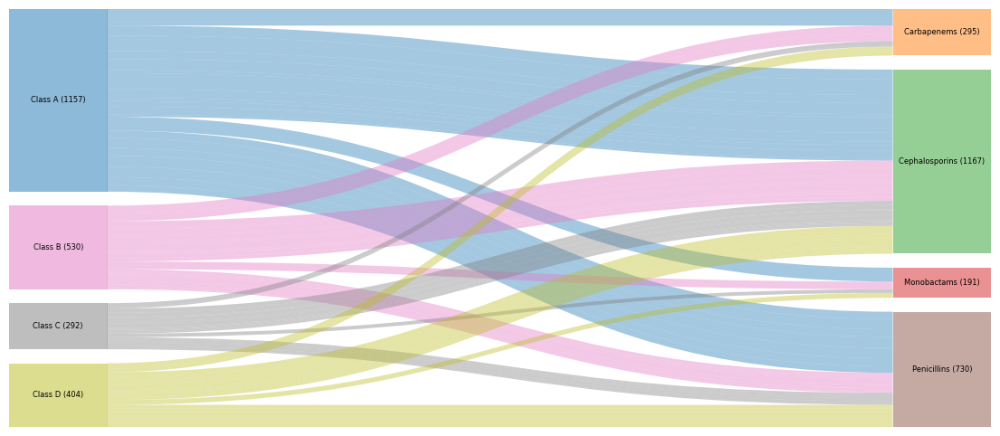

In [9]:
plt.figure(figsize=(14,6))
sankey(
    unfold[['protein_name_Count','bla_class', 'antibiotic_class']],
    cmap=plt.get_cmap('tab10'), # flows_color='grey',
    titles_color=None, labels_size=6,
    node_sizes=True    )

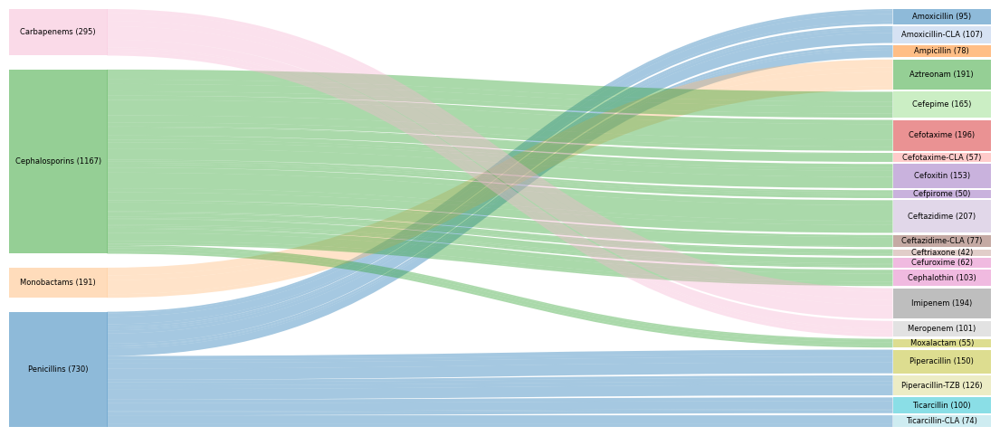

In [10]:
plt.figure(figsize=(14, 6))
sankey(
    unfold[['protein_name_Count', 'antibiotic_class', 'antibiotic']].sort_values("antibiotic"),
    cmap=plt.get_cmap('tab20'),
    titles_color=None, labels_size=6, 
    node_sizes=True)

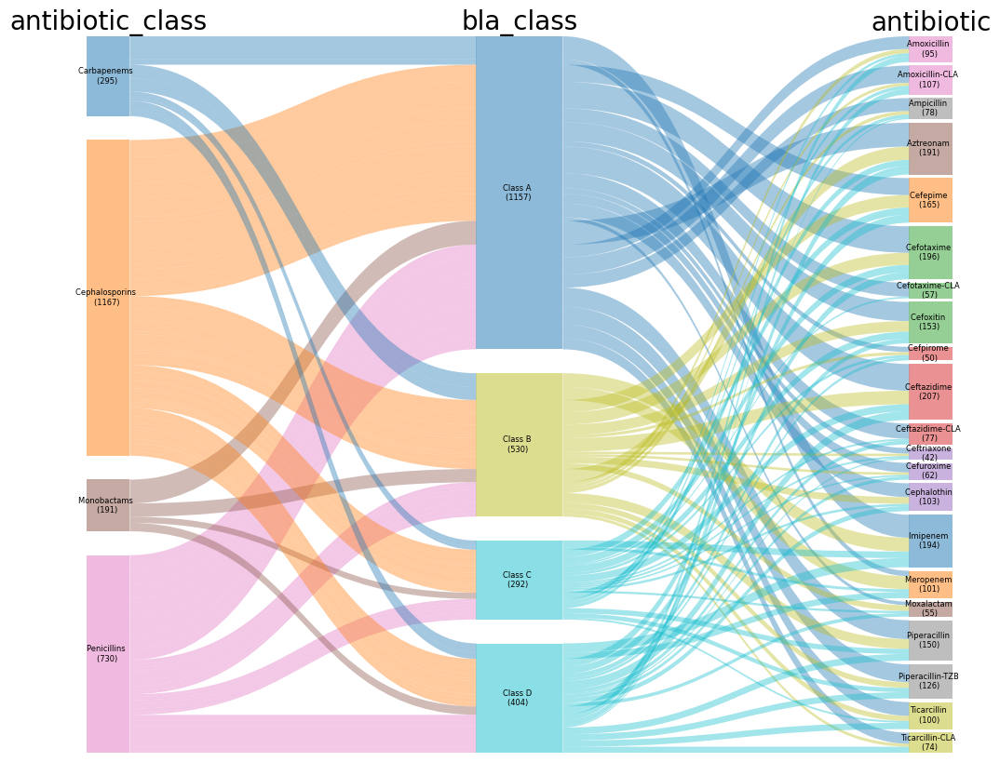

In [35]:
plt.figure(figsize=(12, 10))
sankey(unfold[['protein_name_Count', 'antibiotic_class', 'bla_class',  'antibiotic']],  labels_size=6, 
       node_sizes=' \n({}) ',
       cmap=plt.get_cmap('tab10'))

## boxplots

In [9]:
def do_boxplot(df, sort_hue, x, y, title):
    
    """
    given a df, category (to sort and hue), x and y axis and title, do a violinplot
    """
    
    plt.figure(figsize=(2,5))
    sns.boxplot(data = df.sort_values(sort_hue),
        x = x, y = y, hue = sort_hue, dodge = False)
    plt.grid(alpha = 0.2)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    # plt.legend(loc=(0., 1.05), ncol = 4, frameon = False)
    plt.ylabel("")
    plt.xlabel(title)
    plt.show()

### perclass 

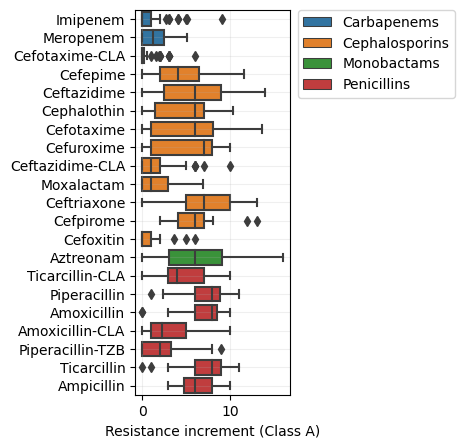

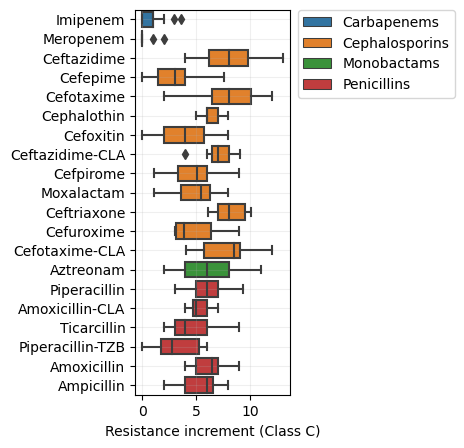

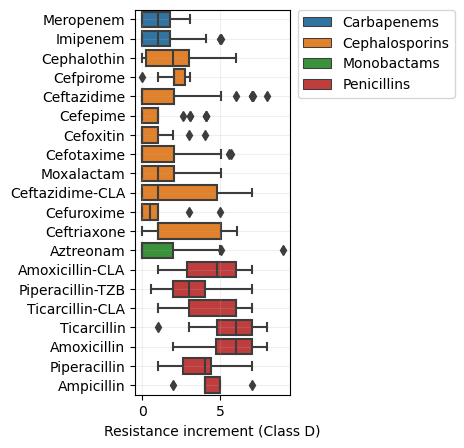

In [6]:
do_boxplot(df_mics_a, "antibiotic_class", "log2_fold", "antibiotic", "Resistance increment (Class A)")
do_boxplot(df_mics_c, "antibiotic_class", "log2_fold", "antibiotic", "Resistance increment (Class C)")
do_boxplot(df_mics_d, "antibiotic_class", "log2_fold", "antibiotic", "Resistance increment (Class D)")

### all

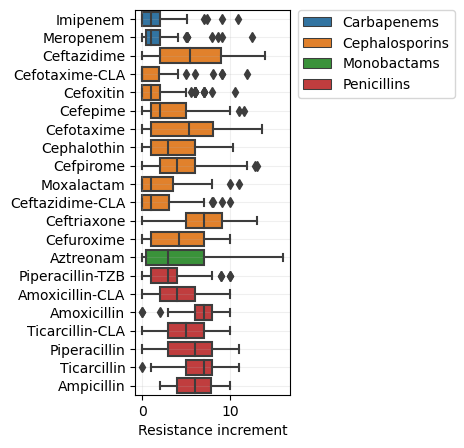

In [7]:
do_boxplot(df_mics, "antibiotic_class", "log2_fold", "antibiotic", "Resistance increment")

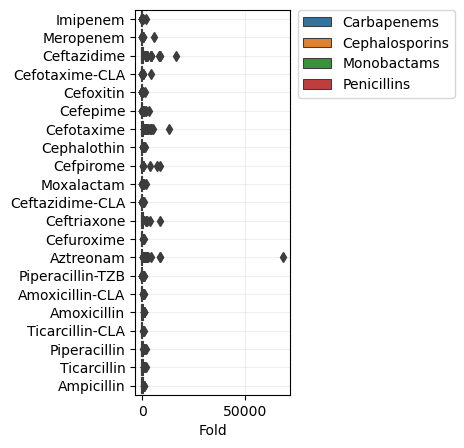

In [8]:
do_boxplot(df_mics, "antibiotic_class", "fold", "antibiotic", "Fold")

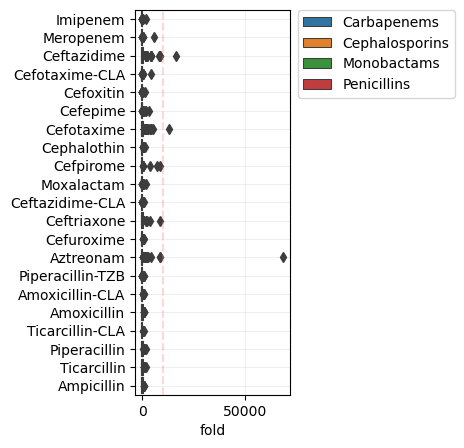

In [9]:
plt.figure(figsize=(2,5))
sns.boxplot(data = df_mics.sort_values("antibiotic_class"),
    x = "fold", y = "antibiotic", hue = "antibiotic_class", dodge = False)
plt.grid(alpha = 0.2)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
# plt.legend(loc=(0., 1.05), ncol = 4, frameon = False)
plt.ylabel("")
plt.axvline(10000, color = "salmon", alpha = 0.3, linestyle = "--")
plt.show()

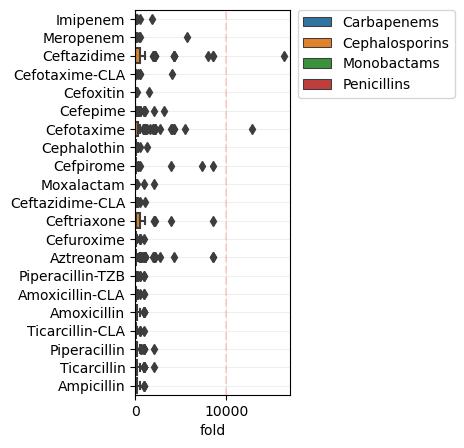

In [10]:
plt.figure(figsize=(2,5))
sns.boxplot(data = df_mics.sort_values("antibiotic_class"),
    x = "fold", y = "antibiotic", hue = "antibiotic_class", dodge = False)
plt.grid(alpha = 0.2)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
# plt.legend(loc=(0., 1.05), ncol = 4, frameon = False)
plt.ylabel("")
plt.xlim(0,17000)
plt.axvline(10000, color = "salmon", alpha = 0.3, linestyle = "--")
plt.show()

In [11]:
fig = px.violin(df_mics.sort_values("fold"), x = "fold", color = "antibiotic", hover_name="protein_name")
fig.update_layout(template="plotly_white")
fig.show()

In [12]:
# TEM-132 with aztreonam appears to be a very extreme value (~68k fold)
df_mics[df_mics.fold > 10000]

,protein_name,antibiotic,antibiotic_class,mic_without_bla,mic_with_bla,fold,log2_fold,#name,seq,length,...,seq_without_sigpept,esm1b,esm,onehot,t5xlu50,t5bfd,xlnet,bepler,carp640M,carp640M_logp
192,CTX-M-32,Cefotaxime,Cephalosporins,0.020,256.0,12800.0,13.643856,gi|1059525863|gb|AOG15804.1|CTX-M-32| class A ...,MVKKSLRQFTLMATATVTLLLGSVPLYAQTADVQQKLAELERQSGG...,291,...,QTADVQQKLAELERQSGGRLGVALINTADNSQILYRADERFAMCST...,"[0.11477877, 0.0029491612, -0.097387925, 0.205...","[-1.38527, 0.0078053786, 0.3046958, -0.1639079...","[0.12371134, 0.0034364262, 0.05154639, 0.03780...","[0.023369633, 0.06078833, 0.02386767, 0.042334...","[0.036971122, 0.050479334, -0.02082786, 0.0408...","[-0.45587415, 0.32532513, -0.10643793, -0.3930...","[0.12371134, 0.05498282, 0.04467354, 0.0515463...","[8.272967, 8.820049, 1.5564672, 13.703179, -8....",-0.203614
741,TEM-132,Aztreonam,Monobactams,0.030,2048.0,68266.7,16.058894,gi|58430780|dbj|BAD89187.1|TEM-132| class A ex...,MSIQHFRVALIPFFAAFCLPVFAHPETLVKVKDAEDQLGARVGYIE...,286,...,HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPMMST...,"[0.08888854, -0.021925872, -0.12774852, 0.2506...","[-1.9883521, -0.27039972, 0.25341597, -0.49435...","[0.1013986, 0.01048951, 0.055944055, 0.0664335...","[0.051410556, 0.1050749, 0.027849399, 0.048867...","[0.04789534, 0.056247246, 0.0039258553, 0.0378...","[-0.27325714, 0.24255604, 0.03472178, -0.22836...","[0.1013986, 0.062937066, 0.027972028, 0.055944...","[9.40543, 10.454733, 4.9981666, 15.463336, -8....",-0.211005
748,TEM-132,Ceftazidime,Cephalosporins,0.125,2048.0,16384.0,14.000000,gi|58430780|dbj|BAD89187.1|TEM-132| class A ex...,MSIQHFRVALIPFFAAFCLPVFAHPETLVKVKDAEDQLGARVGYIE...,286,...,HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPMMST...,"[0.08888854, -0.021925872, -0.12774852, 0.2506...","[-1.9883521, -0.27039972, 0.25341597, -0.49435...","[0.1013986, 0.01048951, 0.055944055, 0.0664335...","[0.051410556, 0.1050749, 0.027849399, 0.048867...","[0.04789534, 0.056247246, 0.0039258553, 0.0378...","[-0.27325714, 0.24255604, 0.03472178, -0.22836...","[0.1013986, 0.062937066, 0.027972028, 0.055944...","[9.40543, 10.454733, 4.9981666, 15.463336, -8....",-0.211005


TEM-132 and CTX-M-32 appears to be extreme values. But this are the reported values in the reference reported in BLDB2:

[Survey of Enterobacteriaceae Producing Extended-Spectrum β-Lactamases in a Slovak Hospital: Dominance of SHV-2a and Characterization of TEM-132](https://journals.asm.org/doi/10.1128/AAC.49.7.3066-3069.2005?url_ver=Z39.88-2003&rfr_id=ori:rid:crossref.org&rfr_dat=cr_pub%20%200pubmed)
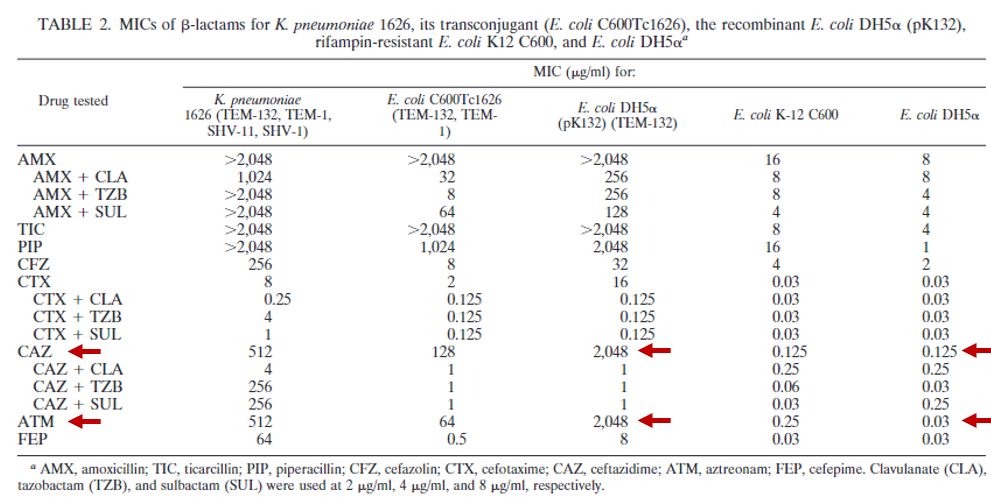


[High-Level Resistance to Ceftazidime Conferred by a Novel Enzyme, CTX-M-32, Derived from CTX-M-1 through a Single Asp240-Gly Substitution](https://journals.asm.org/doi/10.1128/AAC.48.6.2308-2313.2004?url_ver=Z39.88-2003&rfr_id=ori:rid:crossref.org&rfr_dat=cr_pub%20%200pubmed)
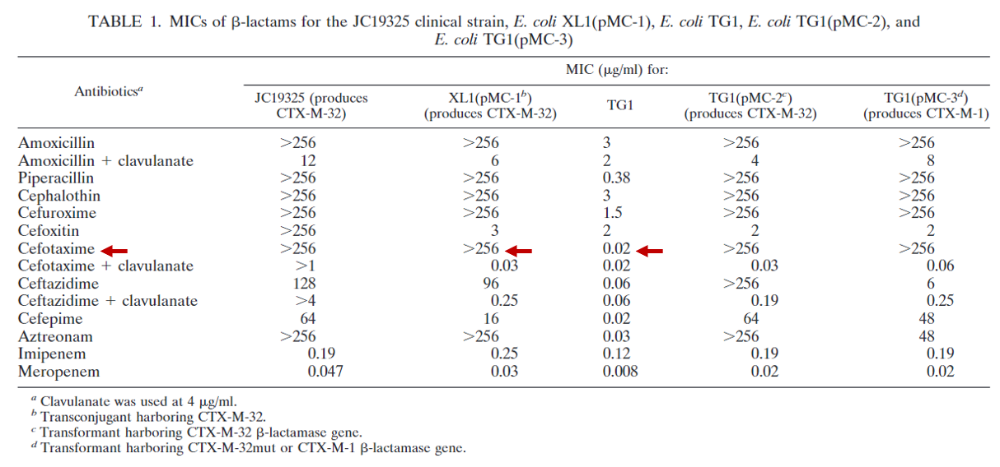

### sbl

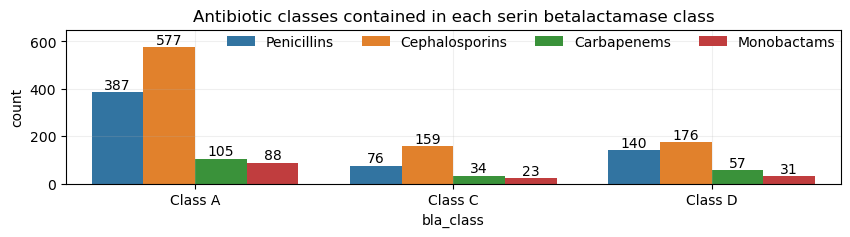

In [13]:
# https://stackoverflow.com/questions/73674585/pandas-matplotlib-labels-bars-as-percentage 
plt.figure(figsize=(10,2))
ax = sns.countplot(df_mics_sbl, x = "bla_class", hue = "antibiotic_class")
plt.legend(ncol = 4,  loc="best", borderaxespad=0, frameon = False)
plt.grid(alpha = 0.2)
plt.ylim(0,650)
plt.title("Antibiotic classes contained in each serin betalactamase class")
for container in ax.containers:
    ax.bar_label(container)

In [14]:
# merge annots classes 
filters = [
    df_mics_sbl.bla_class.str.contains("Class A"),
    df_mics_sbl.bla_class.str.contains("Class C|Class D")
]

values = ["Class A", "Class CD"]

df_mics_sbl["bla_class_mod"] = np.select(filters, values)
df_mics_sbl.head(1)

/tmp/ipykernel_722/1773928225.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,protein_name,antibiotic,antibiotic_class,mic_without_bla,mic_with_bla,fold,log2_fold,#name,seq,length,...,esm1b,esm,onehot,t5xlu50,t5bfd,xlnet,bepler,carp640M,carp640M_logp,bla_class_mod
0,SFO-1,Amoxicillin,Penicillins,1.0,256.0,256.0,8.0,gi|226440723|gb|ACO57221.1|SFO-1| class A exte...,MVKNTLRQTTLMVATVMPLLFGSAPLWAQSANAKANIQQQLSELEK...,295,...,"[0.12884726, -0.014014147, -0.14221768, 0.2163...","[-1.3039657, 0.1604022, 0.17407279, 0.09927225...","[0.1220339, 0.0033898305, 0.050847456, 0.04745...","[0.015114492, 0.04356348, 0.019283863, 0.03084...","[0.0176283, 0.018968944, -0.04833036, 0.040485...","[-0.46188685, 0.24787414, -0.09181613, -0.2707...","[0.1220339, 0.040677965, 0.050847456, 0.050847...","[9.180886, 8.3046465, 2.616951, 13.753964, -8....",-0.227483,Class A


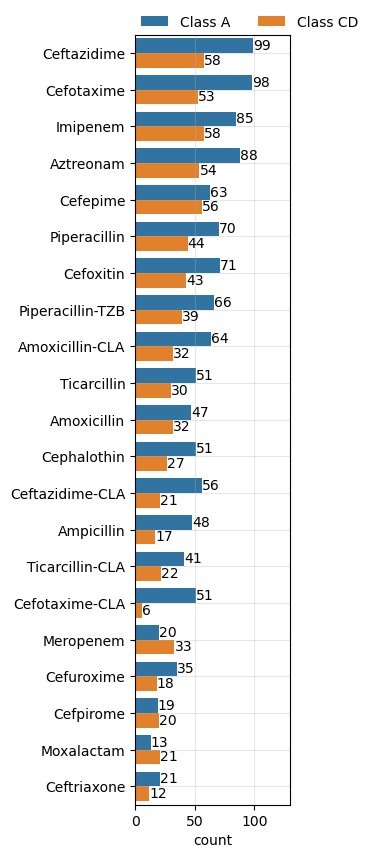

In [15]:
plt.figure(figsize=(2,10))
ax = sns.countplot(df_mics_sbl, y = "antibiotic", hue = "bla_class_mod",
             order = pd.value_counts(df_mics_sbl["antibiotic"]).index)
plt.xticks(rotation = 0)
plt.grid(alpha = 0.3)
plt.ylabel("")
plt.xlim(0,130)
plt.legend(ncol = 4,  loc=(0,1), borderaxespad=0, frameon = False)
for container in ax.containers:
    ax.bar_label(container)

# distro plot

## violin

from above violin plots we need to remove the outliers points because it looks atypical, and maybe are errors
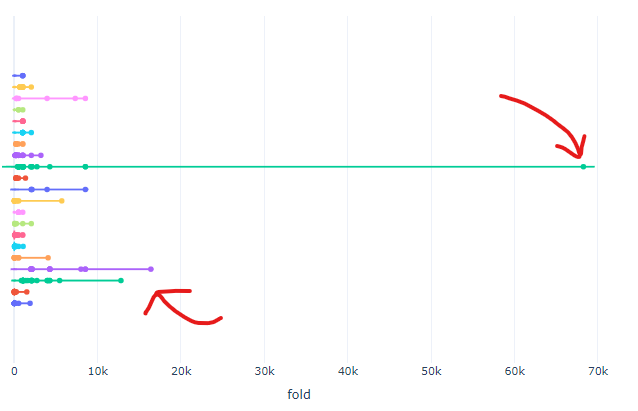

In [6]:
print(f"seqs to remove | ids = {df_mics[df_mics.fold > 10000].seq_id.to_list()} | names = {df_mics[df_mics.fold > 10000].protein_name.to_list()} ")
print(f"total data points = {len(df_mics)}")

seqs to remove | ids = ['seq_9666', 'seq_12590', 'seq_12590'] | names = ['CTX-M-32', 'TEM-132', 'TEM-132'] 
total data points = 2383


In [7]:
df_mics_clean = df_mics[df_mics["fold"] <= 10000]
print(f"total data points = {len(df_mics_clean)}")

total data points = 2380


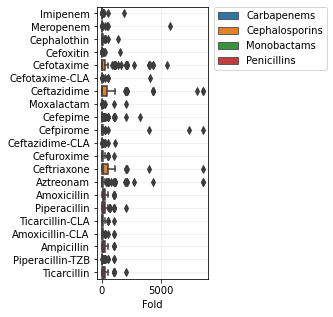

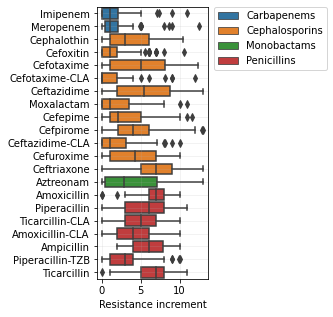

In [10]:
do_boxplot(df_mics_clean, "antibiotic_class", "fold", "antibiotic", "Fold")
do_boxplot(df_mics_clean, "antibiotic_class", "log2_fold", "antibiotic", "Resistance increment")

Text(0.5, 0, '')

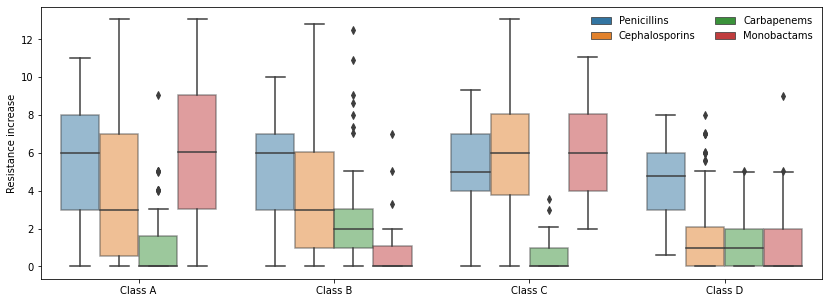

In [11]:
plt.figure(figsize=(14,5))
ax = sns.boxplot(data = df_mics_clean, x = "bla_class" , y = "log2_fold", hue = "antibiotic_class", boxprops=dict(alpha=0.5))
plt.legend(ncol = 2, loc = "best", frameon = False)
plt.ylabel("Resistance increase")
plt.xlabel("")

Text(0, 0.5, 'Resistance increase')

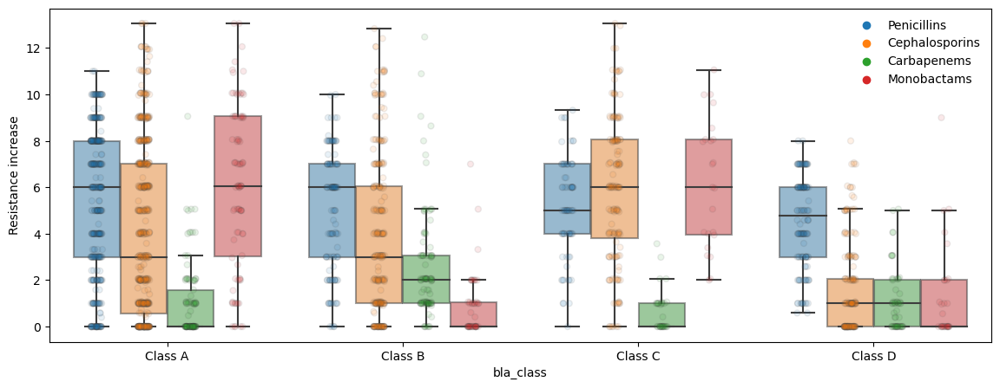

In [23]:
# https://stackoverflow.com/questions/35538882/seaborn-boxplot-stripplot-duplicate-legend
plt.figure(figsize=(14,5))

sns.stripplot(data=df_mics_clean, x="bla_class", y="log2_fold", hue="antibiotic_class",palette="tab10",
    jitter=True, dodge=True, linewidth=1, alpha = 0.1, edgecolor='gray')

# plot
ax = sns.boxplot(data=df_mics_clean, x="bla_class", y="log2_fold", hue="antibiotic_class", palette="tab10",
    fliersize=0, boxprops=dict(alpha=0.5))

# Get the handles and labels
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[0:4], labels[0:4], frameon = False)
plt.ylabel("Resistance increase")

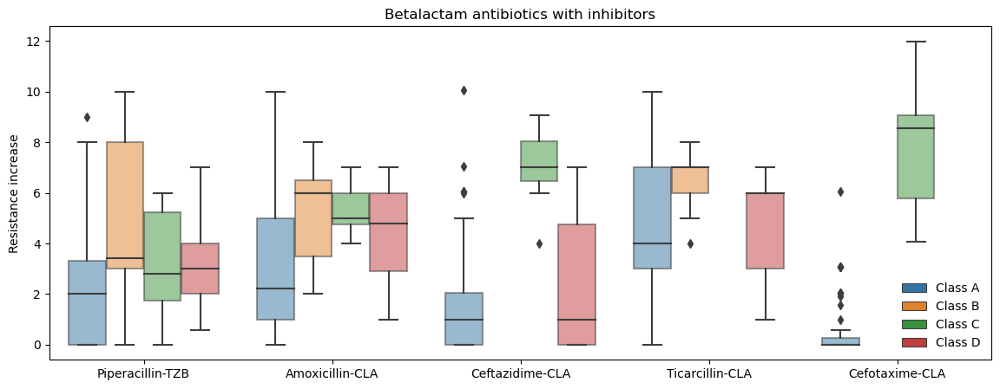

In [14]:
# select data w/inhibitors
inhib = df_mics_clean[df_mics_clean.antibiotic.str.contains("-CLA|-TZB")]

plt.figure(figsize=(14,5))
sns.boxplot(data = inhib, x = "antibiotic" , y = "log2_fold", hue = "bla_class", boxprops=dict(alpha=0.5),
           order = ['Piperacillin-TZB','Amoxicillin-CLA','Ceftazidime-CLA','Ticarcillin-CLA','Cefotaxime-CLA'])
plt.legend(frameon = False)
plt.ylabel("Resistance increase")
plt.xlabel("")
plt.title("Betalactam antibiotics with inhibitors");

In [12]:
df_mics_clean_a = df_mics_clean[df_mics_clean.bla_class == "Class A"]

In [13]:
# DEFINICIONES DEL PAPER DE PHILIPPON DEL 2019 

# No estan: SPU
# Cbl en el paper esta como CblA en la BLDB
cluster_a = [
    "PER","VEB","CSP","SPU","CME","CIA","CGA","TLA","TLA2","LUS","CfxA",
    "CepA", "CblA"
]

# estan todas
cluster_b = [
    "PME","SGM","GES","BEL"
]

# no estan: VHH VHW AmpC MP RHOCA RTG SEL PSE
# cambie OKP por OKP-A/B que no estan en la bldb
cluster_c = [
    "VHH","VHW","AmpC", "MP","RHOCA","LAP","SHV","OHIO","LEN",
    "OKP","TER","GIL","TEM", "RUB","RTG","SCO","SEL",
    "HER","PSE","AER", "CKO","MAL","PLES","CARB","PAL","HMS",
    "ORN", "KLUY", "FPH"
]

# no estan: BlaAZ BlaIII BlaY BlaF STRCE STRCL STRFR STRLA STRAL FAR STRCAO STRCA
cluster_d = [
    "CAD","BlaAZ", "ARL","ROB", "ACI","CBP","BCL","BlaIII","BlaP",
    "OIH","BlaY","BlaS","BlaF","STRCE", "STRCL","STRFR","STRLA",
    "STRAL","MAB","FAR","AST", "BlaC", "STRCAO","STRCA","R39"
]

# no estan: VCC CRS YENT K1
cluster_e = [
    "FRI","VCC","IMI","NMCA","SME","SFC","BIC","CRS","CRH","CRP","KPC",
    "PenB","PenA","LUT","PenL","BPS","PenI","MIN","DES","BES","ERP",
    "YENT","HugA","CumA","SMO","RAHN","FONA","SFO","KLUC",
    "CTX-M","KLUA","KLUG","SED","RIC","GRI","K1","OXY"
]

# todas si estan en la BLDB
cluster_f = [
    "XCC","BOR","AXC","PAD","BKC","GPC", "CzoA", "L2"
]

#cluster_no = [
#    'BcI', 'BRO', 'BBI', 'ASU1', 'BcIII', 'RPA', 'RSA1', 'RSA2', 
#    'SDA', 'FTU', 'GPA', 'RCP', 'FLC', 'FEC', 'DBA', 'PenP', 
#    'RAA', 'CST', 'CPA', 'CM1', 'CKA', 'VBR', 'CdiA', 'PC1', 
#    'PC2', 'PbbA', 'PSV', 'PLA', 'MIA', 'MM3', 'PAU', 'ORF6', 
#    'PenE', 'BlaA', 'AFA']

#cluster_x = [
#     "BRO","FTU", "FPH"
#]


filters = [
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_a)),
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_b)),
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_c)),
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_d)),
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_e)),
    df_mics_clean_a.protein_family_header.str.contains("|".join(cluster_f)),
    # df_a.protein_family_header.str.contains("|".join(cluster_x)),
]

values = ["A","B", "C", "D", "E", "F", 
          #"x"
]

#    "Group C (LSBL; limited-spectrum beta-lactamases)",
#    "Group D (Gram positive)",
#    "Group E (WSBL; wider spectrum betalactamases)",
#    "Group F (Gram negative rods)",
#    "Group A (Subclass A2)"
   
df_mics_clean_a["Group"] = np.select(filters, values)
df_mics_clean_a = df_mics_clean_a.sort_values("Group")

/tmp/ipykernel_367/1955895323.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mics_clean_a["Group"] = np.select(filters, values)


In [14]:
df_mics_clean_a.Group.unique()

array(['A', 'B', 'C', 'D', 'E'], dtype=object)

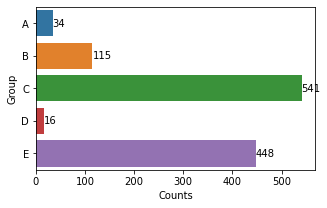

In [15]:
plt.figure(figsize=(5,3))
ax = sns.countplot(data = df_mics_clean_a, y = "Group" )
plt.ylabel("Group")
plt.xlabel("Counts")
ax.bar_label(ax.containers[0]); 

Text(0.5, 0, 'Philippon Group')

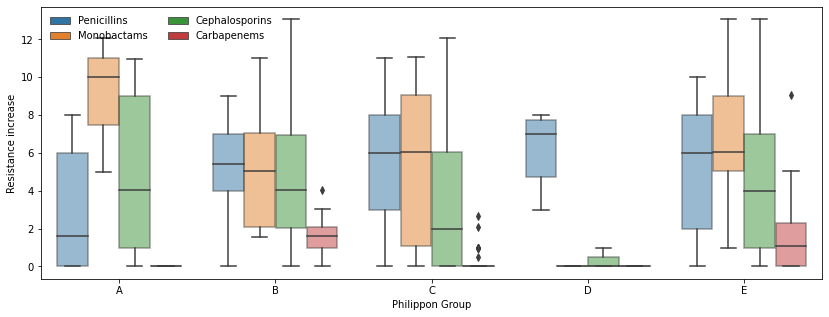

In [16]:
plt.figure(figsize=(14,5))
ax = sns.boxplot(data = df_mics_clean_a, x = "Group" , y = "log2_fold", hue = "antibiotic_class", boxprops=dict(alpha=0.5))
plt.legend(ncol = 2, loc = "best", frameon = False)
plt.ylabel("Resistance increase")
plt.xlabel("Philippon Group")
#plt.title("class A")

In [33]:
df_mics_clean.to_pickle("../results/mics/training_dset_mics_clean.pkl")

## tax

In [28]:
# take a subset
df_tax = df_mics_sbl[['Phylum', 'Class', 'Order', 'Family', 'Genus']]
# group by counts
df_tax_grouped = df_tax.groupby(["Phylum", "Class", "Order","Family"]).count()
df_tax_grouped

Genus
Phylum              Class                  Order                Family                      
p__Actinobacteriota c__Actinomycetia       o__Mycobacteriales   f__Mycobacteriaceae       16
p__Campylobacterota c__Campylobacteria     o__Campylobacterales f__Campylobacteraceae      9
p__Proteobacteria   c__Alphaproteobacteria o__Rhizobiales       f__Rhizobiaceae           15
                                           o__Sphingomonadales  f__Sphingomonadaceae      16
                    c__Gammaproteobacteria o__Burkholderiales   f__Burkholderiaceae       51
                                                                f__Nitrosomonadaceae      15
                                           o__Enterobacterales  f__Aeromonadaceae        103
                                                                f__Enterobacteriaceae    249
                                                                f__Shewanellaceae         66
                                           o__Pseudomonadales   f__Moraxellaceae          82
                                                                f__Pseudomonadaceae       25
                                                                f__UBA7239                25

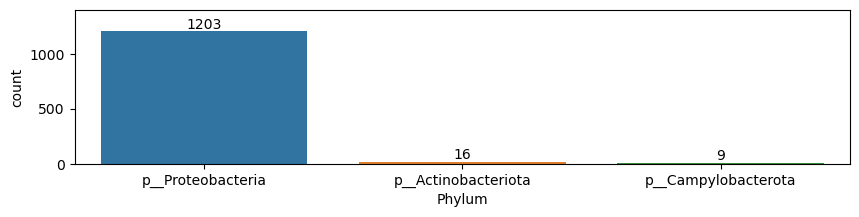

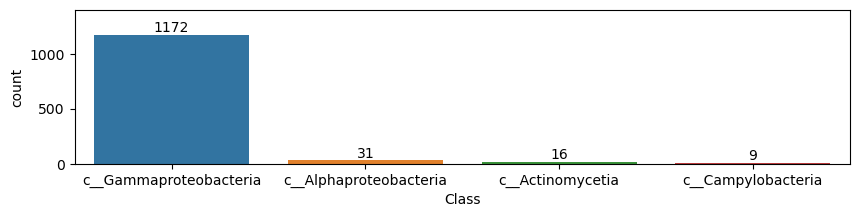

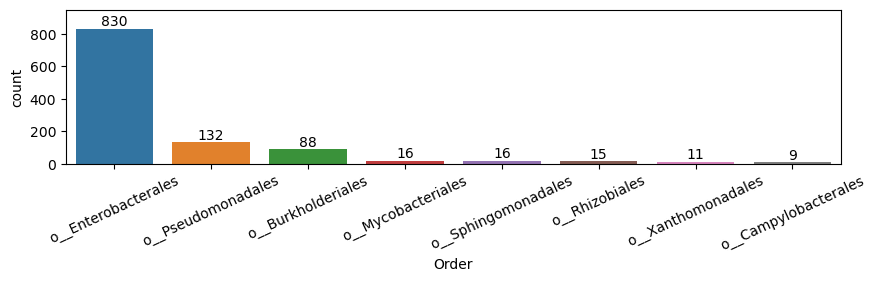

In [29]:
plt.figure(figsize=(10,2))
ax = sns.countplot(df_tax, x = "Phylum",order = pd.value_counts(df_tax["Phylum"]).index)
plt.ylim(0,1400)
ax.bar_label(ax.containers[0], size=10)

plt.figure(figsize=(10,2))
ax = sns.countplot(df_tax, x = "Class",order = pd.value_counts(df_tax["Class"]).index)
plt.ylim(0,1400)
ax.bar_label(ax.containers[0], size=10)

plt.figure(figsize=(10,2))
ax = sns.countplot(df_tax, x = "Order", order = pd.value_counts(df_tax["Order"]).index)
plt.ylim(0,950)
plt.xticks(rotation = 25)
ax.bar_label(ax.containers[0], size=10);

In [30]:
unfold_tax = df_tax_grouped.reset_index()
unfold_tax

,Phylum,Class,Order,Family,Genus
0,p__Actinobacteriota,c__Actinomycetia,o__Mycobacteriales,f__Mycobacteriaceae,16
1,p__Campylobacterota,c__Campylobacteria,o__Campylobacterales,f__Campylobacteraceae,9
2,p__Proteobacteria,c__Alphaproteobacteria,o__Rhizobiales,f__Rhizobiaceae,15
3,p__Proteobacteria,c__Alphaproteobacteria,o__Sphingomonadales,f__Sphingomonadaceae,16
4,p__Proteobacteria,c__Gammaproteobacteria,o__Burkholderiales,f__Burkholderiaceae,51
5,p__Proteobacteria,c__Gammaproteobacteria,o__Burkholderiales,f__Nitrosomonadaceae,15
6,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Aeromonadaceae,103
7,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Enterobacteriaceae,249
8,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Shewanellaceae,66
9,p__Proteobacteria,c__Gammaproteobacteria,o__Pseudomonadales,f__Moraxellaceae,82


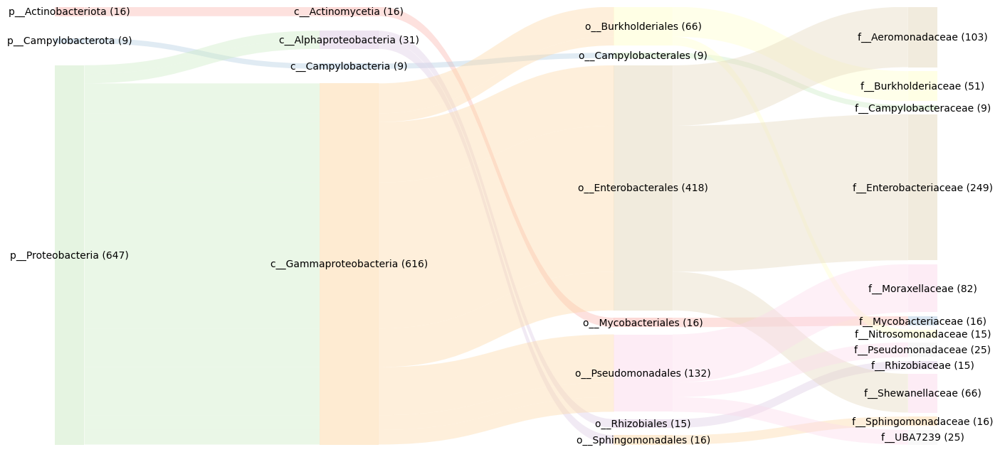

In [31]:
plt.figure(figsize=(16,8))
sankey(
    unfold_tax.iloc[:, [4,0,1,2,3]],
    cmap=plt.get_cmap('Pastel1'), # flows_color='grey',
    titles_color=None, labels_size=10,
    node_sizes=True )

## seq ident

In [104]:
# export seqs, do a msa and trim with gappyout
df_mics_a[["protein_name", "seq"]].drop_duplicates().to_csv(
    "../results/mics/seqs/class_A_training_dset_mics.csv", index = False, sep ="\t")

df_mics_b[["protein_name", "seq"]].drop_duplicates().to_csv(
    "../results/mics/seqs/class_B_training_dset_mics.csv", index = False, sep ="\t")

df_mics_c[["protein_name", "seq"]].drop_duplicates().to_csv(
    "../results/mics/seqs/class_C_training_dset_mics.csv", index = False, sep ="\t")

df_mics_d[["protein_name", "seq"]].drop_duplicates().to_csv(
    "../results/mics/seqs/class_D_training_dset_mics.csv", index = False, sep ="\t")

In [105]:
ls ../results/mics/seqs/msas/

msa_class_a_training_dset_mics.fasta*
msa_class_a_training_dset_mics_gappyout.fasta
msa_class_b_training_dset_mics.fasta*
msa_class_b_training_dset_mics_gappyout.fasta
msa_class_c_training_dset_mics.fasta*
msa_class_c_training_dset_mics_gappyout.fasta
msa_class_d_training_dset_mics.fasta*
msa_class_d_training_dset_mics_gappyout.fasta
msa_class_serin_training_dset_mics.fasta*
msa_class_serin_training_dset_mics_gappyout.fasta


In [120]:
def do_ident_mat(msa, title):
    
    """
    plot a identity matrix given a MSA
    """
    
    # Read in a sequence alignment from a fasta file
    msa_input = "../results/mics/seqs/msas/" + msa
    with open(msa_input, "r") as infile:
        aln = Alignment.from_file(infile, format="fasta")
    
    # Sequence length and number of sequences
    print(f"alignment is of length {aln.L} and has {aln.N} sequences")
    
    # calculate the percent identity of every sequence in the alignment to the first sequence
    aln.identities_to(aln.matrix[0])
    
    identity_matrix = np.zeros((aln.N, aln.N))
    identity_matrix.fill(np.nan)
    
    #loop through each sequence
    for idx in range(identity_matrix.shape[0]):
    
        #calculate all the percent identitites to that sequence
        idents = aln.identities_to(aln.matrix[idx,:])
        identity_matrix[idx] = idents
    
    # plot
    print(f"Minimum sequence identity detected for {msa}: {identity_matrix.min()} \n")
    
    g = sns.clustermap(identity_matrix, yticklabels=aln.ids, xticklabels=aln.ids, cmap = "Spectral_r",
                   dendrogram_ratio=(.07, .07), method = "ward", metric = "euclidean",
                   cbar_pos=(0.3, -0.05, 0.5, 0.03), cbar_kws={"orientation": "horizontal"})
    
    if aln.N > 100: 
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 6)
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 6)
        
    title = "Sequence identity for "  + title
    plt.title(title)

alignment is of length 284 and has 103 sequences
Minimum sequence identity detected for msa_class_a_training_dset_mics_gappyout.fasta: 0.1936619718309859 

alignment is of length 314 and has 51 sequences
Minimum sequence identity detected for msa_class_b_training_dset_mics_gappyout.fasta: 0.08917197452229299 

alignment is of length 378 and has 27 sequences
Minimum sequence identity detected for msa_class_c_training_dset_mics_gappyout.fasta: 0.35978835978835977 

alignment is of length 263 and has 34 sequences
Minimum sequence identity detected for msa_class_d_training_dset_mics_gappyout.fasta: 0.1482889733840304 



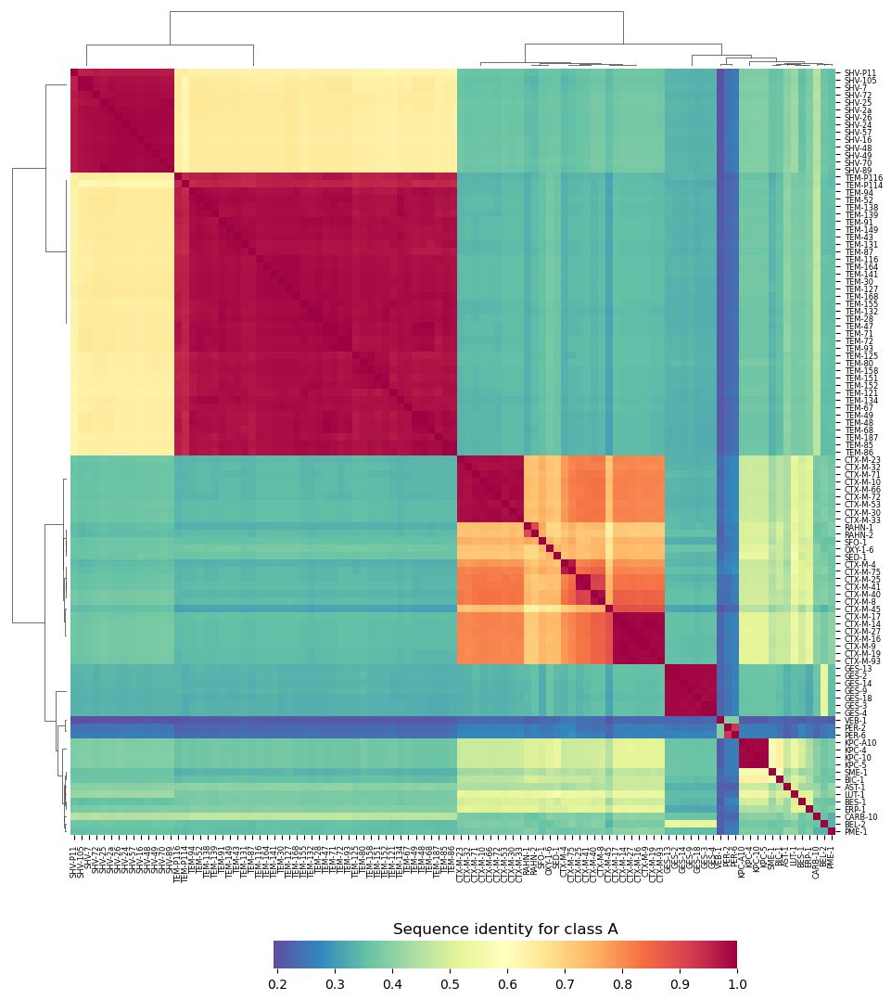

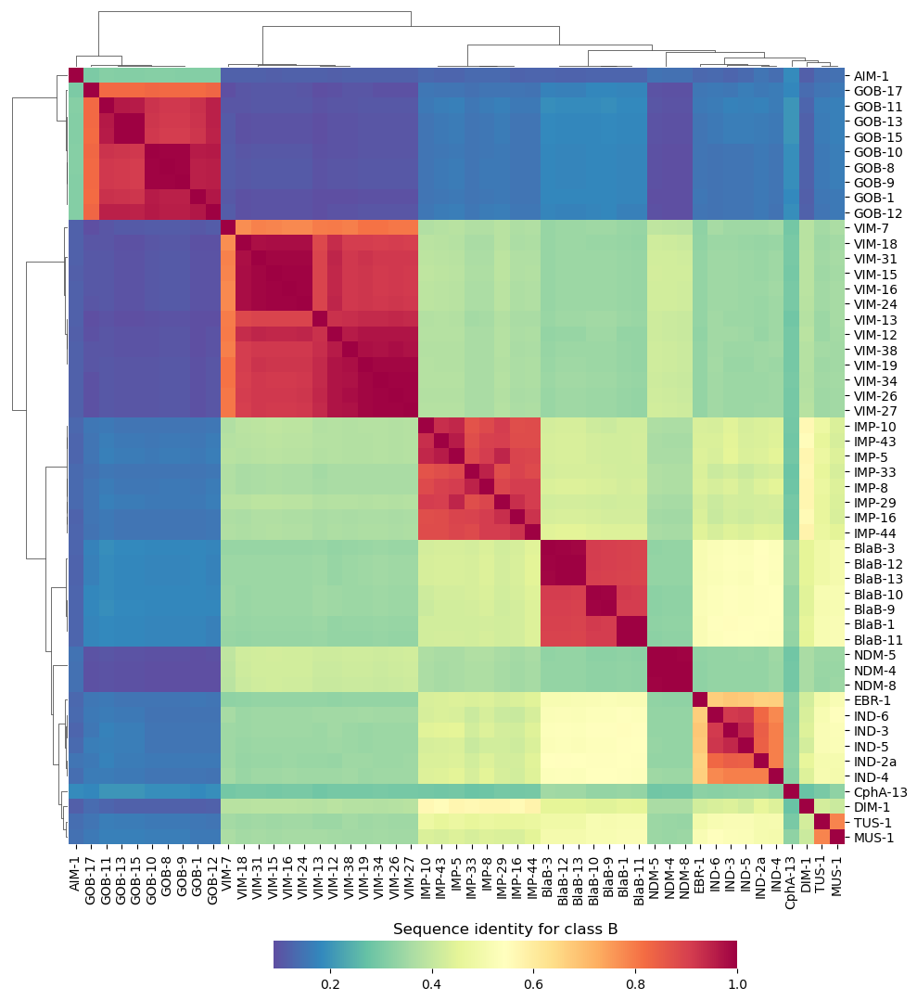

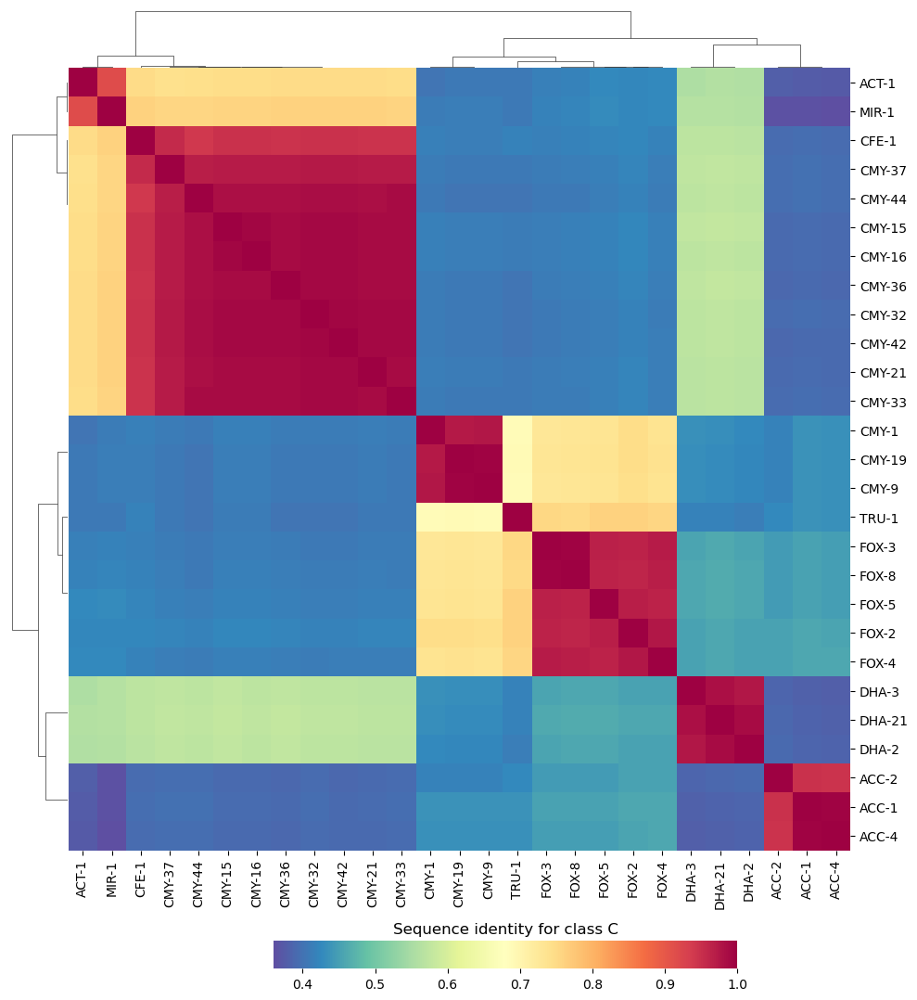

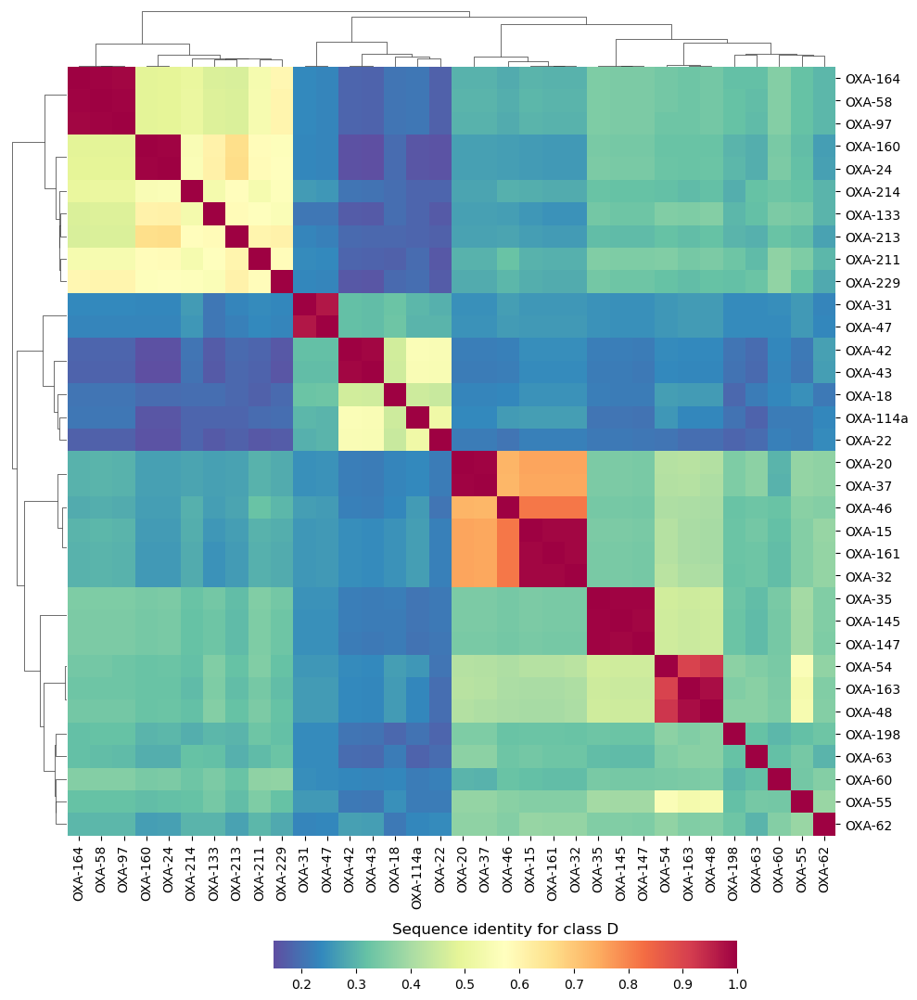

In [121]:
do_ident_mat("msa_class_a_training_dset_mics_gappyout.fasta", "class A")
do_ident_mat("msa_class_b_training_dset_mics_gappyout.fasta", "class B")
do_ident_mat("msa_class_c_training_dset_mics_gappyout.fasta", "class C")
do_ident_mat("msa_class_d_training_dset_mics_gappyout.fasta", "class D")

## corr matrix 

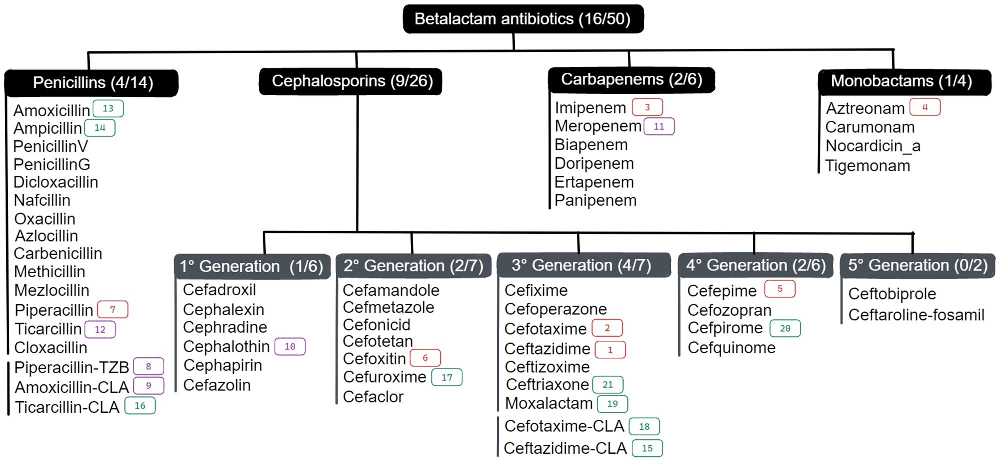

In [6]:
# load data 
df_mics_clean = pd.read_pickle("../results/mics/training_dset_mics_clean.pkl")
df_mics_clean.iloc[:, 0:7]

,protein_name,antibiotic,antibiotic_class,mic_without_bla,mic_with_bla,fold,log2_fold
0,SFO-1,Amoxicillin,Penicillins,1.000,256.00,256.00000,8.000000
1,SFO-1,Amoxicillin-CLA,Penicillins,2.000,256.00,128.00000,7.000000
2,SFO-1,Ceftazidime,Cephalosporins,0.125,16.00,128.00000,7.000000
3,SFO-1,Piperacillin,Penicillins,0.500,256.00,512.00000,9.000000
4,SFO-1,Imipenem,Carbapenems,0.250,0.50,2.00000,1.000000
...,...,...,...,...,...,...,...
2378,OXA-97,Ampicillin,Penicillins,4.000,512.00,128.00000,7.000000
2379,OXA-97,Imipenem,Carbapenems,0.060,1.00,16.66670,4.058897
2380,OXA-97,Ticarcillin,Penicillins,4.000,512.00,128.00000,7.000000
2381,OXA-97,Meropenem,Carbapenems,0.060,0.50,8.33333,3.058893


In [7]:
df_pivot = df_mics_clean.pivot("protein_name", "antibiotic", "log2_fold")

# sort by antibiotic class
df_pivot_sorted = df_pivot.reindex(columns=[
     # peni
    'Amoxicillin','Amoxicillin-CLA','Ampicillin', 'Piperacillin','Piperacillin-TZB','Ticarcillin','Ticarcillin-CLA',
    # mono
    'Aztreonam',
    # Carba
    'Imipenem','Meropenem', 
    # ceph1
    'Cephalothin',
    # ceph2
    'Cefuroxime','Cefoxitin',
    # ceph3
    'Cefotaxime', 'Cefotaxime-CLA', 'Ceftazidime','Ceftazidime-CLA', 'Ceftriaxone', 'Moxalactam',
    # ceph4
    'Cefepime', 'Cefpirome'
]) 

df_pivot_sorted

antibiotic,Amoxicillin,Amoxicillin-CLA,Ampicillin,Piperacillin,Piperacillin-TZB,Ticarcillin,Ticarcillin-CLA,Aztreonam,Imipenem,Meropenem,...,Cefuroxime,Cefoxitin,Cefotaxime,Cefotaxime-CLA,Ceftazidime,Ceftazidime-CLA,Ceftriaxone,Moxalactam,Cefepime,Cefpirome
protein_name,,,,,,,,,,,,,,,,,,,,,
ACC-1,NaN,NaN,NaN,9.000000,5.000000,NaN,NaN,3.058893,0.000000,0.000000,...,NaN,0.000000,6.058894,NaN,6.943417,6.943417,NaN,2.058895,3.022368,3.058893
ACC-2,6.0,6.000000,NaN,3.000000,NaN,2.00000,NaN,2.058895,1.000000,NaN,...,NaN,0.000000,5.058892,NaN,8.058895,8.058895,6.058894,NaN,2.000000,6.058894
ACC-4,7.0,NaN,NaN,8.000000,6.000000,NaN,NaN,5.058892,0.000000,NaN,...,9.000000,1.000000,10.058898,NaN,11.000000,NaN,10.058898,NaN,2.058895,NaN
ACT-1,NaN,NaN,NaN,5.000000,0.000000,NaN,NaN,3.943415,1.000000,NaN,...,NaN,6.000000,2.000000,NaN,3.943415,NaN,7.058890,NaN,0.000000,NaN
AIM-1,NaN,NaN,4.415035,4.584963,NaN,NaN,NaN,0.411198,1.411193,1.965784,...,0.584963,1.000000,6.411196,NaN,5.000000,NaN,NaN,NaN,2.569856,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VIM-27,NaN,NaN,NaN,9.000000,10.000000,8.00000,8.00000,0.000000,3.643856,2.662964,...,NaN,5.584963,10.058898,NaN,11.000000,NaN,NaN,NaN,7.643856,NaN
VIM-31,NaN,NaN,NaN,4.000000,3.415042,7.41504,7.41504,3.321928,1.584963,1.476439,...,NaN,NaN,NaN,NaN,2.965784,NaN,NaN,NaN,1.569856,NaN
VIM-34,NaN,2.584963,NaN,NaN,3.000000,NaN,7.00000,0.000000,1.604071,0.523562,...,NaN,0.000000,4.000000,NaN,5.395930,NaN,NaN,NaN,4.965784,5.965784


In [8]:
# plot function
def do_corr_mat(method, df, title):
    
    """
    Compute a corr matrix given a method (pearson/spearman), df and title
    """
    
    # compute corr, mask and color palette
    corr_r = df.corr(method = method)
    mask_r = np.triu(np.ones_like(corr_r, dtype=bool)) 
    custom_cmap = sns.diverging_palette(15, 250, as_cmap=True) # custom diverging cmap
    
    # plot
    plt.figure(figsize=(10, 10))
    sns.heatmap(
        corr_r, mask = mask_r, cmap = "Spectral_r", vmax = 1, vmin = -1, annot=True, fmt = ".2f",
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 7, "alpha": 0.5},
        cbar_kws = {"shrink": 0.5, "location": "bottom", "pad": -1})
    plt.title(f"{title} ({method} correlation)")
    plt.ylabel("")
    plt.xlabel("")
    plt.show()
    
    
def do_corr_mat_annot(method, df, title, mode):
    
    """
    Compute a corr matrix given a method (pearson/spearman), df and title and mode (simple/extended) of color annots
    """
    
    # compute corr
    df_sim = df_pivot_sorted.corr(method=method)
    df_sim = df_sim.reset_index()
    
    # set antibiotic classes
    penicillins = ["Amoxicillin", "Ampicillin", "PenicillinV", "PenicillinG","Dicloxacillin", "Nafcillin", "Oxacillin", 
                   "Azlocillin", "Carbenicillin", "Methicillin", "Mezlocillin", "Piperacillin", "Ticarcillin", "Cloxacillin"]
    cephalosporins_1 = ["Cefadroxil", "Cephalexin","Cephradine","Cephalothin","Cephapirin","Cefazolin"]
    cephalosporins_2 = ["Cefamandole","Cefmetazole","Cefonicid","Cefotetan","Cefoxitin","Cefuroxime","Cefaclor"]
    cephalosporins_3 = ["Cefixime","Cefoperazone","Cefotaxime","Ceftazidime","Ceftizoxime","Ceftriaxone","Moxalactam"]
    cephalosporins_4 = ["Cefepime","Cefozopran","Cefpirome","Cefquinome"]
    cephalosporins = cephalosporins_1 + cephalosporins_2 + cephalosporins_3 + cephalosporins_4
    carbapenems = ["Imipenem","Meropenem","Biapenem","Doripenem","Ertapenem","Panipenem"]
    monobactams = ["Aztreonam","Carumonam","Nocardicin_a","Tigemonam"]
    
    # select the type of  anotations
    if mode == "extended":
        filters = [
            df_sim.antibiotic.str.contains('|'.join(penicillins)), 
            df_sim.antibiotic.str.contains('|'.join(cephalosporins_1)),
            df_sim.antibiotic.str.contains('|'.join(cephalosporins_2)),
            df_sim.antibiotic.str.contains('|'.join(cephalosporins_3)),
            df_sim.antibiotic.str.contains('|'.join(cephalosporins_4)),
            df_sim.antibiotic.str.contains('|'.join(carbapenems)),
            df_sim.antibiotic.str.contains('|'.join(monobactams))]
    
        values = ["Penicillins", "1°G Cephalosporins" , "2°G Cephalosporins", "3°G Cephalosporins", "4°G Cephalosporins",
               "Carbapenems", "Monobactams"]
    
    elif mode == "simple":
            filters = [
                df_sim.antibiotic.str.contains('|'.join(penicillins)), 
                df_sim.antibiotic.str.contains('|'.join(cephalosporins)),
                df_sim.antibiotic.str.contains('|'.join(carbapenems)),
                df_sim.antibiotic.str.contains('|'.join(monobactams))]
            
            values = ["Penicillins", "Cephalosporins", "Carbapenems", "Monobactams"]

    
    # add annots
    df_sim["anti_class_expand"] = np.select(filters, values)
    
    # cluster plot
    # create a color palette and legend structure
    if mode == "extended":
        colors = df_sim.anti_class_expand.map({
            "Penicillins": "salmon",
            "1°G Cephalosporins": "cyan",
            "2°G Cephalosporins": "deepskyblue",
            "3°G Cephalosporins": "royalblue",
            "4°G Cephalosporins": "mediumblue",
            "Monobactams": "palegreen",
            "Carbapenems": "palegoldenrod"})
    
    elif mode == "simple":
        colors = df_sim.anti_class_expand.map({
            "Penicillins": "salmon",
            "Cephalosporins": "cornflowerblue",
            "2°G Cephalosporins": "deepskyblue",
            "Monobactams": "palegreen",
            "Carbapenems": "palegoldenrod"})
    
    # create legend structures
    lut = dict(zip(df_sim.anti_class_expand.to_list(), colors))
    handles = [Patch(facecolor = lut[name]) for name in lut]
    custom_cmap = sns.diverging_palette(15, 250, as_cmap=True)
    
    # plot 
    df_num = df_sim.select_dtypes(["number"])
    
    sns.clustermap(
        df_num, method = "ward", metric="euclidean", figsize=(14, 14), annot = True, fmt = ".2f",
        annot_kws = {"fontsize": 10, "alpha": 0.5}, robust = True, vmax = 1, vmin = -1,
        cmap = "Spectral_r", xticklabels = True, yticklabels = df_sim.antibiotic,
        row_colors = colors.to_list(), col_colors = colors.to_list(), 
        cbar_pos = (0.05, 0.76, 0.03,0.2), cbar_kws={'label': f'{method} correlation'}) 
    plt.legend(
        handles, lut, title = "Antibiotic class", loc = "best", frameon = False, ncol = 1,
        bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, prop={'size': 11})
    plt.show()

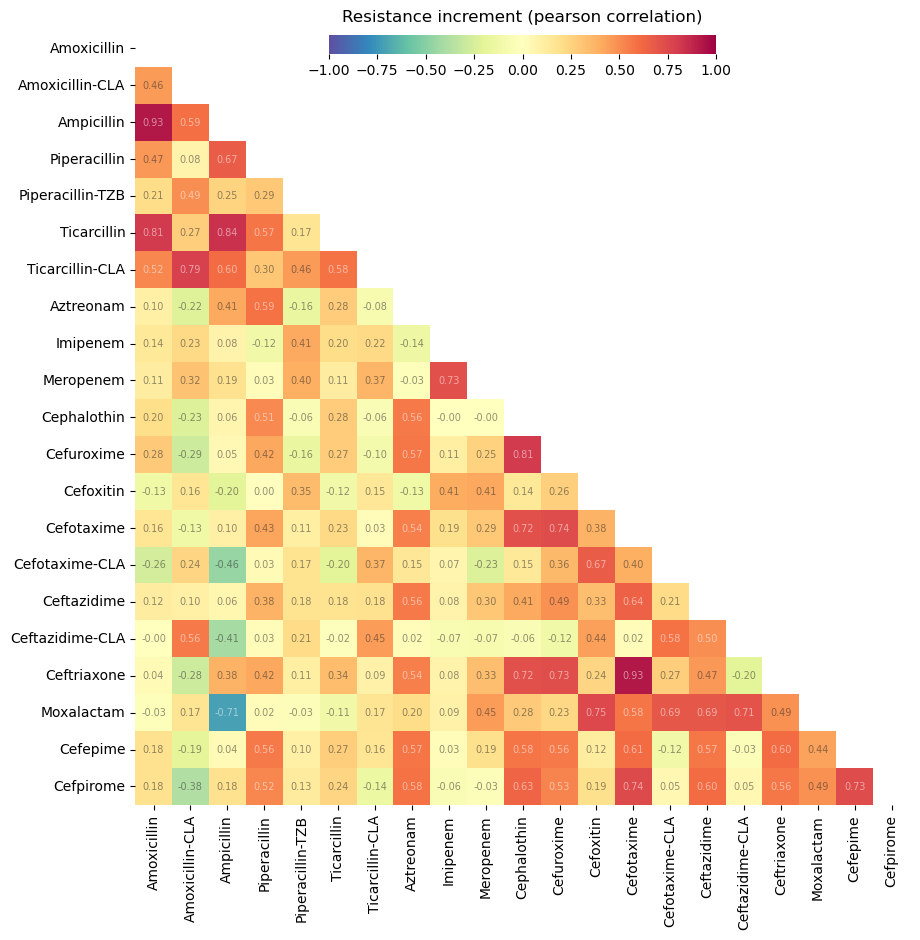

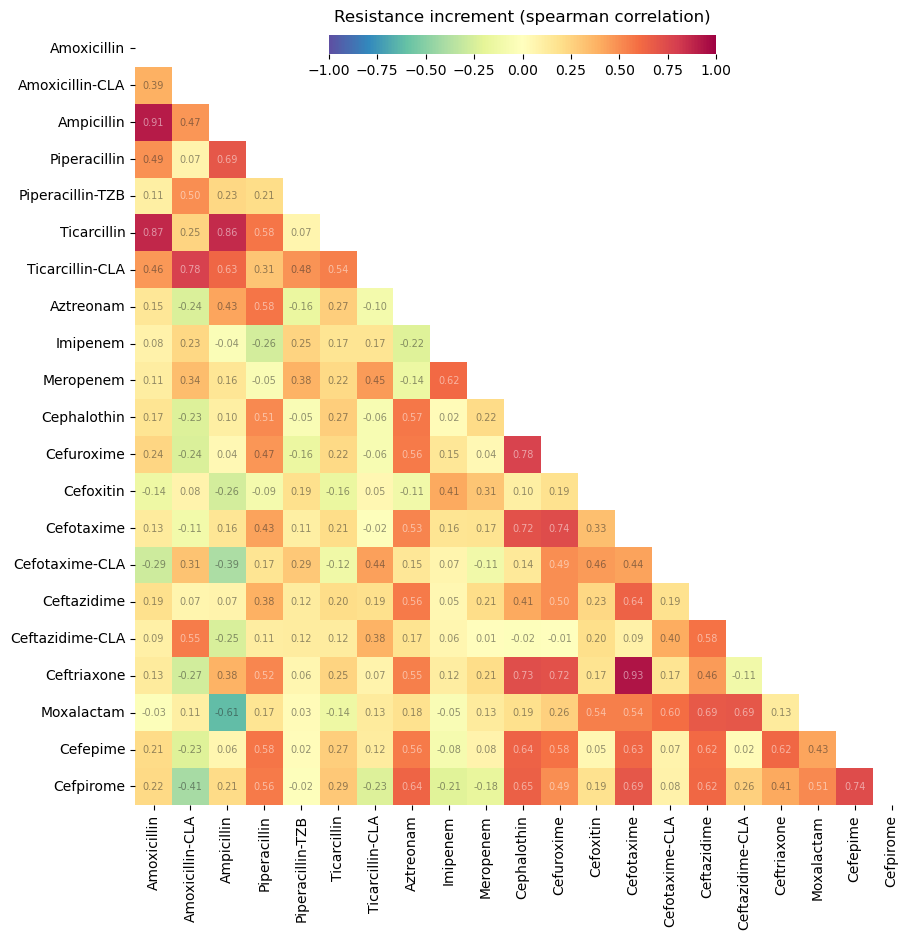

In [5]:
do_corr_mat("pearson", df_pivot_sorted, "Resistance increment")
do_corr_mat("spearman", df_pivot_sorted, "Resistance increment")

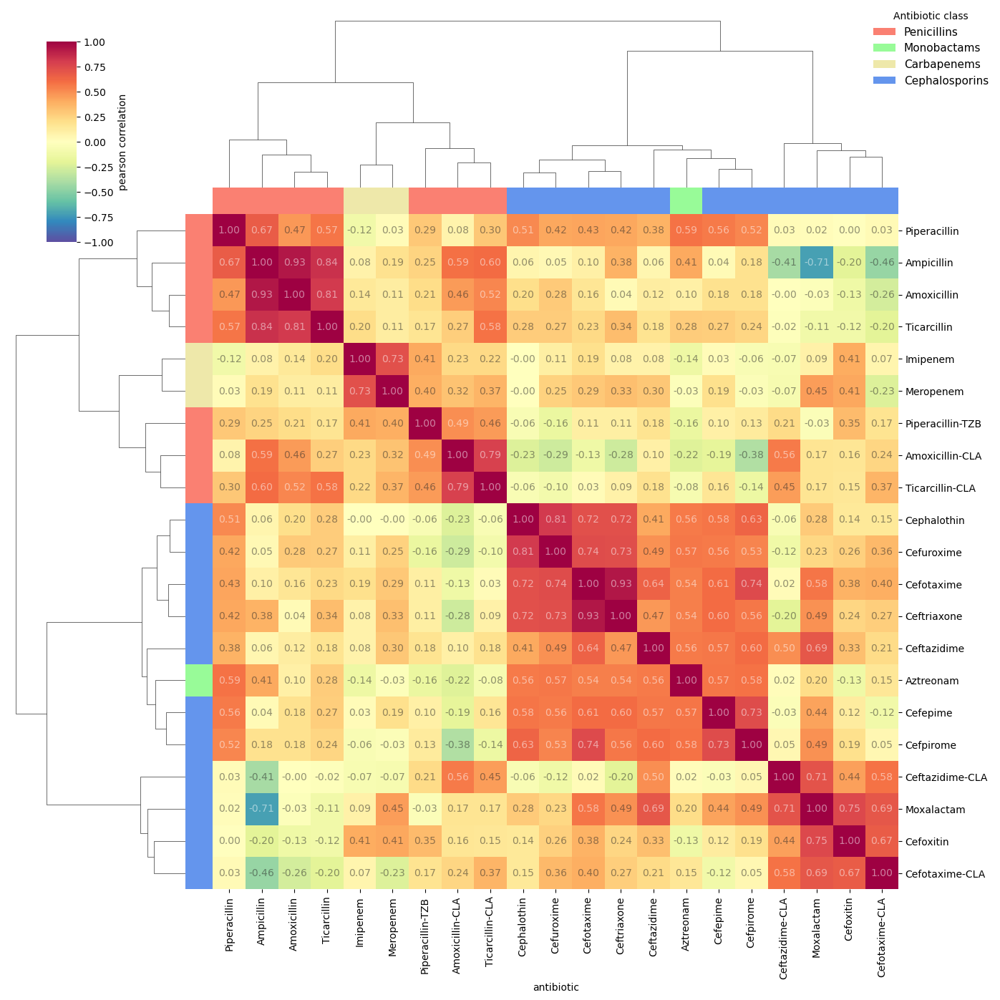

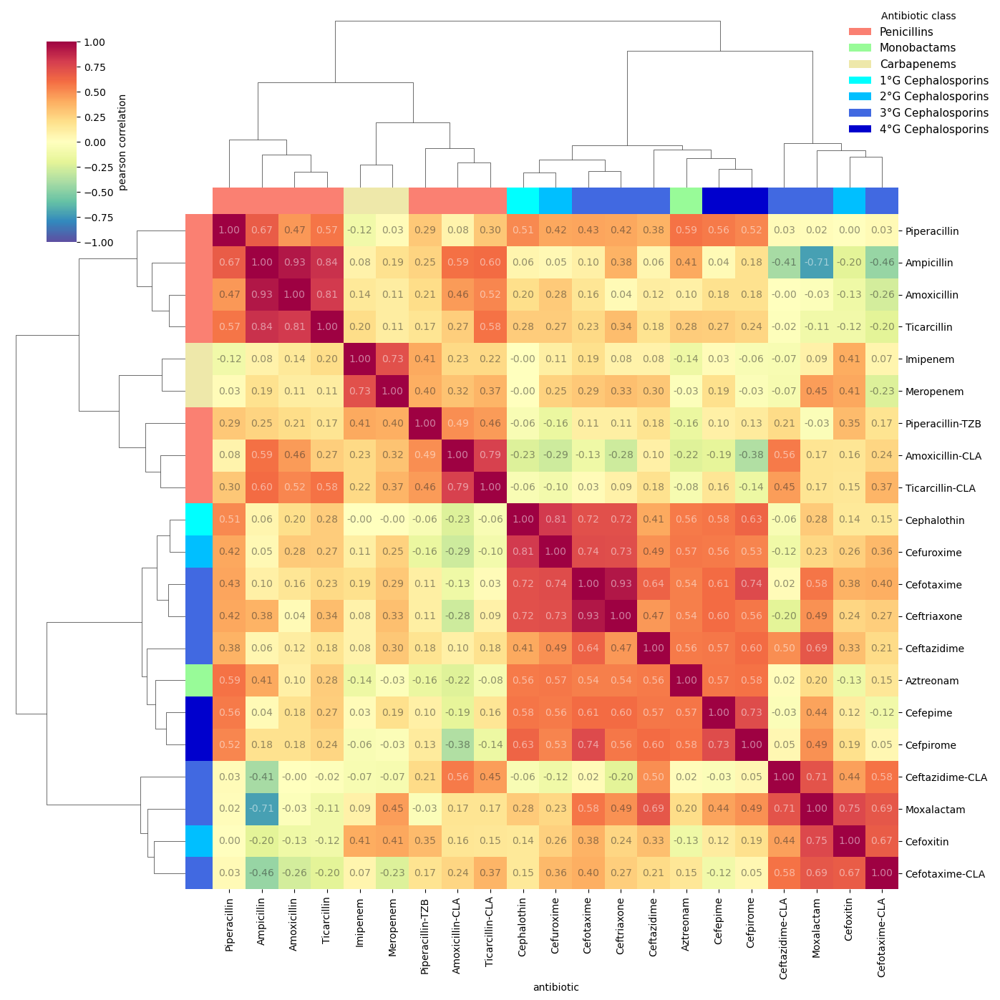

In [6]:
do_corr_mat_annot("pearson", df_pivot_sorted, "Resistance increment", "simple")
do_corr_mat_annot("pearson", df_pivot_sorted, "Resistance increment", "extended")


In [25]:
col_lst = []
data_lst = []
for col in df_pivot_sorted.columns:
    col_lst.append(col)
    data_lst.append(df_pivot_sorted[col].count())
df_data_points = pd.DataFrame()
df_data_points["antibiotic"] = col_lst
df_data_points["counts"] = data_lst
df_data_points = df_data_points.sort_values("counts").reset_index(drop = True)
print(f"total data = {df_data_points.counts.sum()}")
df_data_points

total data = 2380


,antibiotic,counts
0,Ceftriaxone,42
1,Cefpirome,50
2,Moxalactam,55
3,Cefotaxime-CLA,57
4,Cefuroxime,62
5,Ticarcillin-CLA,74
6,Ceftazidime-CLA,77
7,Ampicillin,78
8,Amoxicillin,95
9,Ticarcillin,100


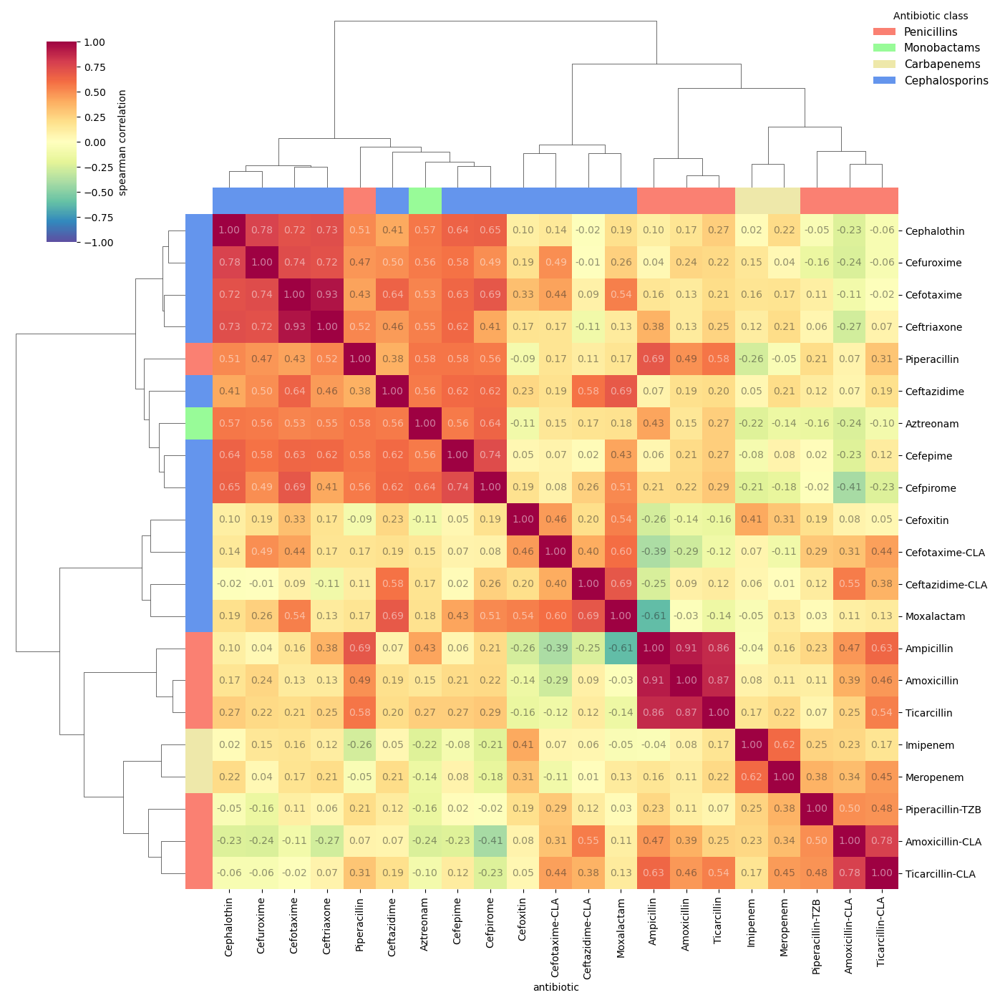

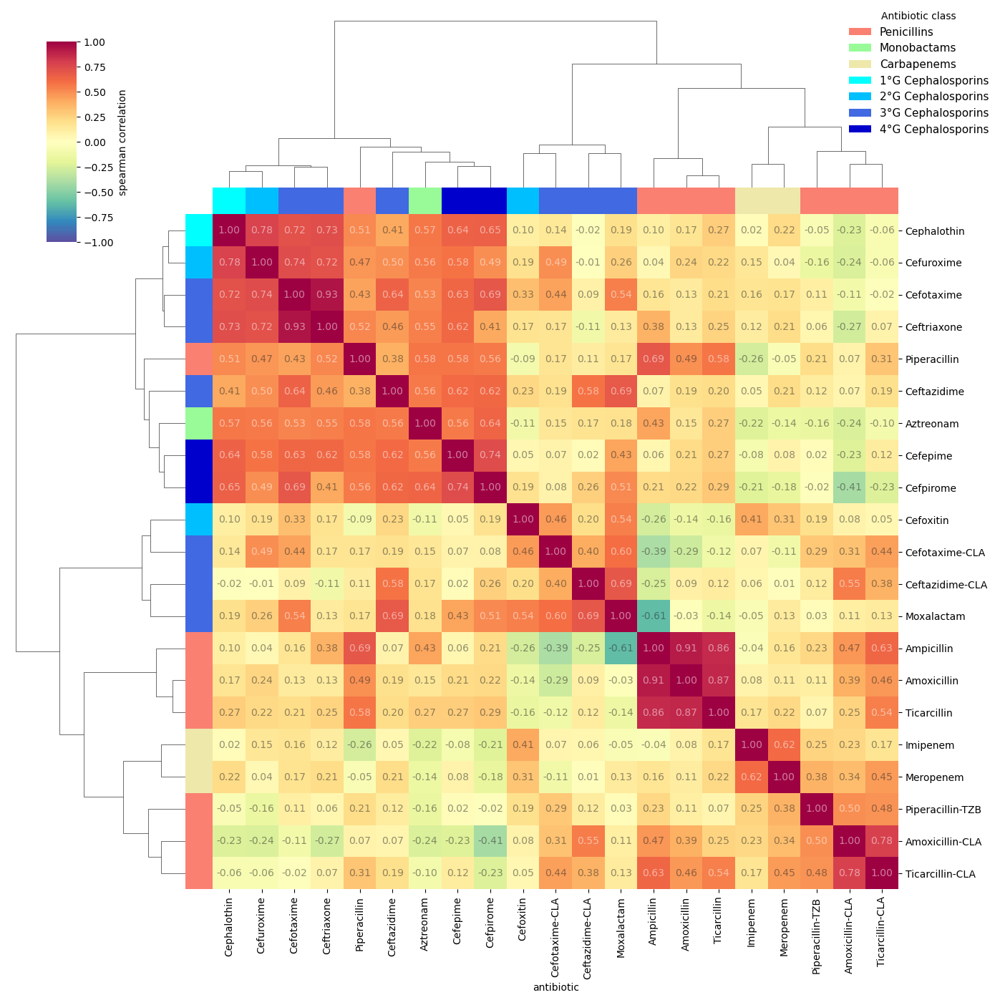

In [8]:
do_corr_mat_annot("spearman", df_pivot_sorted, "Resistance increment", "simple")
do_corr_mat_annot("spearman", df_pivot_sorted, "Resistance increment", "extended")

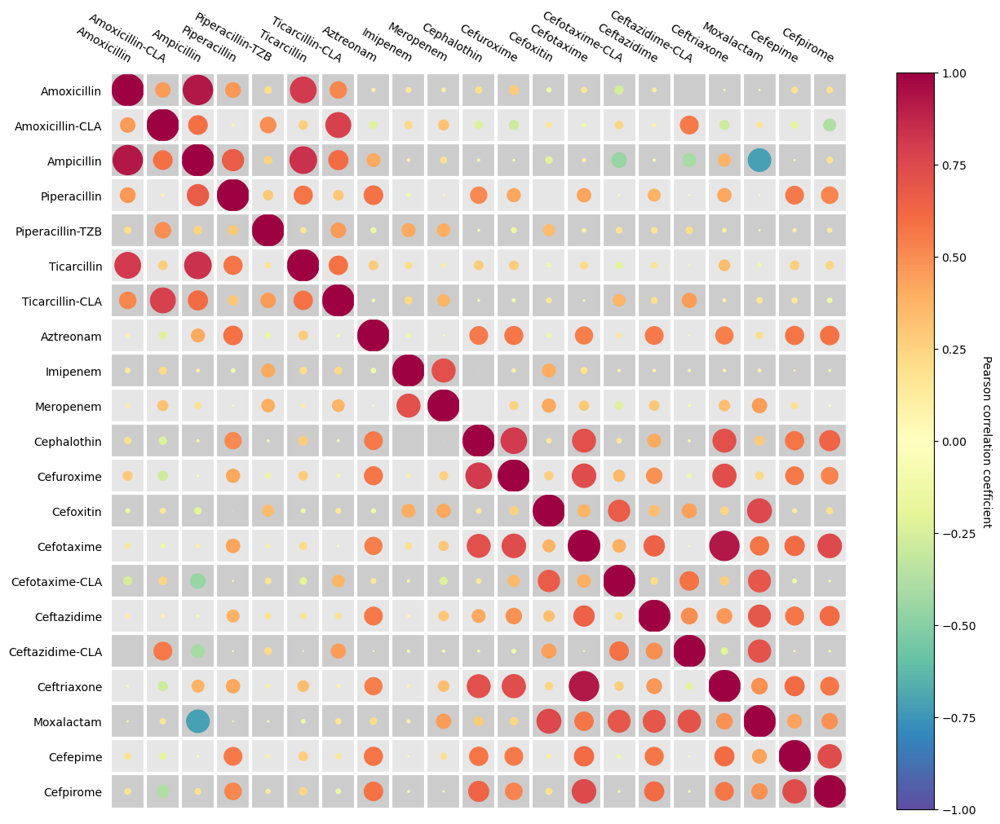

In [13]:
kwargs = {
    'heatmap': {
        'vmin': -1,
        'vmax': 1,
        'cmap': 'Spectral_r',
    },
    'figure': {
        'figsize': (14, 10),
    },
}

plot_correlation_heatmap(df_pivot_sorted, bubble=True, annotate=False, **kwargs)
plt.show()

## corr tanimoto-mics

In [2]:
df_mics_clean = pd.read_pickle("../results/mics/training_dset_mics_clean.pkl")

# remove antibiotic-inhibitor combinations with -TZB and -CLA
df_mics_clean.antibiotic.unique()

array(['Amoxicillin', 'Amoxicillin-CLA', 'Ceftazidime', 'Piperacillin',
       'Imipenem', 'Cefepime', 'Aztreonam', 'Cefotaxime',
       'Ceftazidime-CLA', 'Cephalothin', 'Piperacillin-TZB',
       'Ceftriaxone', 'Cefoxitin', 'Ticarcillin-CLA', 'Ticarcillin',
       'Cefotaxime-CLA', 'Meropenem', 'Cefuroxime', 'Cefpirome',
       'Moxalactam', 'Ampicillin'], dtype=object)

In [3]:
df_mics_filterd = df_mics_clean[~df_mics_clean.antibiotic.str.contains("-CLA|-TZB")]
df_mics_filterd.antibiotic.unique()

array(['Amoxicillin', 'Ceftazidime', 'Piperacillin', 'Imipenem',
       'Cefepime', 'Aztreonam', 'Cefotaxime', 'Cephalothin',
       'Ceftriaxone', 'Cefoxitin', 'Ticarcillin', 'Meropenem',
       'Cefuroxime', 'Cefpirome', 'Moxalactam', 'Ampicillin'],
      dtype=object)

`pivot()` handle missing values by default, in a such way that any missing values will be converted to NaNs in the resulting df DataFrame. In this case, we are removing the missing values that have been converted to NaN by pivot(), which is done automatically by `corr()`  

In [4]:
# pivot df 
df_sorted_wo_inhib = df_mics_filterd.pivot(index = "protein_name", columns= "antibiotic", values= "log2_fold")

# compute corrs
corr_spearman = df_sorted_wo_inhib.corr(method='spearman')
corr_spearman

antibiotic,Amoxicillin,Ampicillin,Aztreonam,Cefepime,Cefotaxime,Cefoxitin,Cefpirome,Ceftazidime,Ceftriaxone,Cefuroxime,Cephalothin,Imipenem,Meropenem,Moxalactam,Piperacillin,Ticarcillin
antibiotic,,,,,,,,,,,,,,,,
Amoxicillin,1.000000,0.907407,0.154695,0.211606,0.130572,-0.138219,0.222582,0.193132,0.126892,0.242133,0.169045,0.080289,0.114238,-0.025680,0.490132,0.872485
Ampicillin,0.907407,1.000000,0.428226,0.056625,0.158785,-0.260549,0.214357,0.074719,0.379760,0.044822,0.104380,-0.039586,0.159628,-0.614333,0.689489,0.862640
Aztreonam,0.154695,0.428226,1.000000,0.560681,0.527867,-0.112201,0.637316,0.557406,0.546537,0.555615,0.568944,-0.220332,-0.144059,0.183199,0.578073,0.272125
Cefepime,0.211606,0.056625,0.560681,1.000000,0.625607,0.053236,0.737362,0.615216,0.618437,0.583912,0.642697,-0.079346,0.077528,0.427169,0.575695,0.268089
Cefotaxime,0.130572,0.158785,0.527867,0.625607,1.000000,0.332398,0.690896,0.642629,0.932500,0.735556,0.716436,0.164418,0.174549,0.540488,0.433565,0.207315
Cefoxitin,-0.138219,-0.260549,-0.112201,0.053236,0.332398,1.000000,0.187299,0.231494,0.174026,0.185815,0.101790,0.406786,0.305150,0.543781,-0.087497,-0.156311
Cefpirome,0.222582,0.214357,0.637316,0.737362,0.690896,0.187299,1.000000,0.624624,0.413990,0.494126,0.653666,-0.214692,-0.178820,0.509012,0.557087,0.292372
Ceftazidime,0.193132,0.074719,0.557406,0.615216,0.642629,0.231494,0.624624,1.000000,0.458705,0.496190,0.411666,0.051999,0.208500,0.687385,0.384540,0.204042
Ceftriaxone,0.126892,0.379760,0.546537,0.618437,0.932500,0.174026,0.413990,0.458705,1.000000,0.718418,0.731328,0.116683,0.205978,0.129640,0.516272,0.245096


In [5]:
# reshape the index value to avoid problems in the follow procedure (stacked format)
cols = list(corr_spearman.columns)
corr_spearman = pd.DataFrame(corr_spearman.values, columns=cols)
corr_spearman["antibiotic"] = columns=cols
corr_spearman = corr_spearman.set_index("antibiotic")
corr_spearman

,Amoxicillin,Ampicillin,Aztreonam,Cefepime,Cefotaxime,Cefoxitin,Cefpirome,Ceftazidime,Ceftriaxone,Cefuroxime,Cephalothin,Imipenem,Meropenem,Moxalactam,Piperacillin,Ticarcillin
antibiotic,,,,,,,,,,,,,,,,
Amoxicillin,1.000000,0.907407,0.154695,0.211606,0.130572,-0.138219,0.222582,0.193132,0.126892,0.242133,0.169045,0.080289,0.114238,-0.025680,0.490132,0.872485
Ampicillin,0.907407,1.000000,0.428226,0.056625,0.158785,-0.260549,0.214357,0.074719,0.379760,0.044822,0.104380,-0.039586,0.159628,-0.614333,0.689489,0.862640
Aztreonam,0.154695,0.428226,1.000000,0.560681,0.527867,-0.112201,0.637316,0.557406,0.546537,0.555615,0.568944,-0.220332,-0.144059,0.183199,0.578073,0.272125
Cefepime,0.211606,0.056625,0.560681,1.000000,0.625607,0.053236,0.737362,0.615216,0.618437,0.583912,0.642697,-0.079346,0.077528,0.427169,0.575695,0.268089
Cefotaxime,0.130572,0.158785,0.527867,0.625607,1.000000,0.332398,0.690896,0.642629,0.932500,0.735556,0.716436,0.164418,0.174549,0.540488,0.433565,0.207315
Cefoxitin,-0.138219,-0.260549,-0.112201,0.053236,0.332398,1.000000,0.187299,0.231494,0.174026,0.185815,0.101790,0.406786,0.305150,0.543781,-0.087497,-0.156311
Cefpirome,0.222582,0.214357,0.637316,0.737362,0.690896,0.187299,1.000000,0.624624,0.413990,0.494126,0.653666,-0.214692,-0.178820,0.509012,0.557087,0.292372
Ceftazidime,0.193132,0.074719,0.557406,0.615216,0.642629,0.231494,0.624624,1.000000,0.458705,0.496190,0.411666,0.051999,0.208500,0.687385,0.384540,0.204042
Ceftriaxone,0.126892,0.379760,0.546537,0.618437,0.932500,0.174026,0.413990,0.458705,1.000000,0.718418,0.731328,0.116683,0.205978,0.129640,0.516272,0.245096


In [6]:
# https://localcoder.org/how-to-calculate-p-values-for-pairwise-correlation-of-columns-in-pandas
# A simple fx that compute the spearman corrs and associated p-vals
# only take the p-val
def spearmanr_pval(x,y):
    return stats.spearmanr(x, y)[1]
    
p_vals = df_sorted_wo_inhib.corr(method = spearmanr_pval)
p_vals

antibiotic,Amoxicillin,Ampicillin,Aztreonam,Cefepime,Cefotaxime,Cefoxitin,Cefpirome,Ceftazidime,Ceftriaxone,Cefuroxime,Cephalothin,Imipenem,Meropenem,Moxalactam,Piperacillin,Ticarcillin
antibiotic,,,,,,,,,,,,,,,,
Amoxicillin,1.000000e+00,1.849315e-03,1.549769e-01,5.633529e-02,2.173325e-01,2.646597e-01,2.057770e-01,6.977667e-02,6.158463e-01,1.271945e-01,1.782551e-01,4.678344e-01,4.886376e-01,8.948013e-01,2.219791e-06,1.020054e-24
Ampicillin,1.849315e-03,1.000000e+00,2.695484e-04,7.022560e-01,1.892121e-01,4.822866e-02,4.819061e-01,5.298336e-01,8.950646e-02,8.511601e-01,6.043666e-01,7.485842e-01,4.171444e-01,4.432914e-02,3.071643e-08,1.195218e-07
Aztreonam,1.549769e-01,2.695484e-04,1.000000e+00,5.827643e-14,5.145336e-14,1.852915e-01,1.456462e-06,9.712729e-17,3.851922e-04,7.244626e-06,2.681040e-09,3.210234e-03,1.614218e-01,1.848446e-01,4.962890e-14,9.467873e-03
Cefepime,5.633529e-02,7.022560e-01,5.827643e-14,1.000000e+00,4.166798e-18,5.554351e-01,2.553726e-08,3.857577e-18,7.512850e-05,3.572238e-06,1.708709e-10,3.248129e-01,4.601198e-01,1.770375e-03,3.267171e-12,1.553026e-02
Cefotaxime,2.173325e-01,1.892121e-01,5.145336e-14,4.166798e-18,1.000000e+00,4.148749e-05,3.918577e-08,1.610741e-23,4.734858e-17,1.460541e-11,7.606712e-17,2.921565e-02,1.018389e-01,2.048104e-05,7.854542e-08,4.381384e-02
Cefoxitin,2.646597e-01,4.822866e-02,1.852915e-01,5.554351e-01,4.148749e-05,1.000000e+00,2.409470e-01,4.236956e-03,3.173987e-01,1.828167e-01,3.568737e-01,4.205131e-07,7.765393e-03,5.387761e-05,3.633809e-01,1.962869e-01
Cefpirome,2.057770e-01,4.819061e-01,1.456462e-06,2.553726e-08,3.918577e-08,2.409470e-01,1.000000e+00,1.247463e-06,1.596309e-01,1.941639e-02,4.975888e-05,1.472867e-01,3.820984e-01,4.803466e-03,1.548561e-04,9.871978e-02
Ceftazidime,6.977667e-02,5.298336e-01,9.712729e-17,3.857577e-18,1.610741e-23,4.236956e-03,1.247463e-06,1.000000e+00,2.248647e-03,5.535189e-05,2.799462e-05,4.773260e-01,3.937363e-02,9.416673e-09,1.794246e-06,4.854206e-02
Ceftriaxone,6.158463e-01,8.950646e-02,3.851922e-04,7.512850e-05,4.734858e-17,3.173987e-01,1.596309e-01,2.248647e-03,1.000000e+00,2.441811e-04,1.101671e-04,4.675234e-01,4.440674e-01,7.211318e-01,6.933439e-03,2.976337e-01


In [7]:
# reshape the index value to avoid problems in the follow procedure (stacked format)
p_vals = pd.DataFrame(p_vals.values, columns=cols)
p_vals["antibiotic"] = cols
p_vals = p_vals.set_index("antibiotic")
p_vals

,Amoxicillin,Ampicillin,Aztreonam,Cefepime,Cefotaxime,Cefoxitin,Cefpirome,Ceftazidime,Ceftriaxone,Cefuroxime,Cephalothin,Imipenem,Meropenem,Moxalactam,Piperacillin,Ticarcillin
antibiotic,,,,,,,,,,,,,,,,
Amoxicillin,1.000000e+00,1.849315e-03,1.549769e-01,5.633529e-02,2.173325e-01,2.646597e-01,2.057770e-01,6.977667e-02,6.158463e-01,1.271945e-01,1.782551e-01,4.678344e-01,4.886376e-01,8.948013e-01,2.219791e-06,1.020054e-24
Ampicillin,1.849315e-03,1.000000e+00,2.695484e-04,7.022560e-01,1.892121e-01,4.822866e-02,4.819061e-01,5.298336e-01,8.950646e-02,8.511601e-01,6.043666e-01,7.485842e-01,4.171444e-01,4.432914e-02,3.071643e-08,1.195218e-07
Aztreonam,1.549769e-01,2.695484e-04,1.000000e+00,5.827643e-14,5.145336e-14,1.852915e-01,1.456462e-06,9.712729e-17,3.851922e-04,7.244626e-06,2.681040e-09,3.210234e-03,1.614218e-01,1.848446e-01,4.962890e-14,9.467873e-03
Cefepime,5.633529e-02,7.022560e-01,5.827643e-14,1.000000e+00,4.166798e-18,5.554351e-01,2.553726e-08,3.857577e-18,7.512850e-05,3.572238e-06,1.708709e-10,3.248129e-01,4.601198e-01,1.770375e-03,3.267171e-12,1.553026e-02
Cefotaxime,2.173325e-01,1.892121e-01,5.145336e-14,4.166798e-18,1.000000e+00,4.148749e-05,3.918577e-08,1.610741e-23,4.734858e-17,1.460541e-11,7.606712e-17,2.921565e-02,1.018389e-01,2.048104e-05,7.854542e-08,4.381384e-02
Cefoxitin,2.646597e-01,4.822866e-02,1.852915e-01,5.554351e-01,4.148749e-05,1.000000e+00,2.409470e-01,4.236956e-03,3.173987e-01,1.828167e-01,3.568737e-01,4.205131e-07,7.765393e-03,5.387761e-05,3.633809e-01,1.962869e-01
Cefpirome,2.057770e-01,4.819061e-01,1.456462e-06,2.553726e-08,3.918577e-08,2.409470e-01,1.000000e+00,1.247463e-06,1.596309e-01,1.941639e-02,4.975888e-05,1.472867e-01,3.820984e-01,4.803466e-03,1.548561e-04,9.871978e-02
Ceftazidime,6.977667e-02,5.298336e-01,9.712729e-17,3.857577e-18,1.610741e-23,4.236956e-03,1.247463e-06,1.000000e+00,2.248647e-03,5.535189e-05,2.799462e-05,4.773260e-01,3.937363e-02,9.416673e-09,1.794246e-06,4.854206e-02
Ceftriaxone,6.158463e-01,8.950646e-02,3.851922e-04,7.512850e-05,4.734858e-17,3.173987e-01,1.596309e-01,2.248647e-03,1.000000e+00,2.441811e-04,1.101671e-04,4.675234e-01,4.440674e-01,7.211318e-01,6.933439e-03,2.976337e-01


Text(0.5, 1.0, 'Correlations values with \n p-val <= 0.05 \n black = presence')

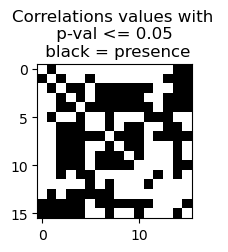

In [8]:
#  check which corrs have p-val <= 0.05
plt.figure(figsize=(2,2))
plt.imshow(p_vals[p_vals <= 0.05].isna(), aspect="auto", interpolation="nearest", cmap="gray")
plt.title("Correlations values with \n p-val <= 0.05 \n black = presence")

In [9]:
# read tanimoto sim results for the 50 antibiotics 
tanimoto = pd.read_csv("../results/tanimoto/tanimoto_sim_canon.csv") 

# Select the antibiotics present in corr_spearman.columns + "antibiotic"
selec_anti = ['antibiotic', 'Amoxicillin','Ticarcillin','Piperacillin','Ampicillin', 'Aztreonam','Moxalactam', 'Imipenem',
    'Meropenem','Cephalothin','Cefuroxime','Cefoxitin','Ceftazidime','Ceftriaxone','Cefotaxime','Cefepime','Cefpirome']

# filter by col from raw tanimoto
tanimoto1 = tanimoto[selec_anti] 
tanimoto2 = tanimoto1[tanimoto1.antibiotic.str.contains("|".join(selec_anti))] 
tanimoto2 = tanimoto2.set_index("antibiotic")
tanimoto2

,Amoxicillin,Ticarcillin,Piperacillin,Ampicillin,Aztreonam,Moxalactam,Imipenem,Meropenem,Cephalothin,Cefuroxime,Cefoxitin,Ceftazidime,Ceftriaxone,Cefotaxime,Cefepime,Cefpirome
antibiotic,,,,,,,,,,,,,,,,
Amoxicillin,1.000000,0.576471,0.447368,0.736842,0.228070,0.296875,0.174757,0.192982,0.252252,0.245763,0.200000,0.215827,0.194245,0.221311,0.190840,0.202899
Ampicillin,0.736842,0.571429,0.567308,1.000000,0.210526,0.197080,0.155340,0.175439,0.256881,0.250000,0.203390,0.255639,0.188406,0.214876,0.184615,0.205882
Piperacillin,0.447368,0.447368,1.000000,0.567308,0.195804,0.216049,0.134328,0.167832,0.259259,0.244755,0.206897,0.250000,0.216049,0.216216,0.183544,0.201220
Ticarcillin,0.576471,1.000000,0.447368,0.571429,0.238938,0.257576,0.152381,0.182609,0.299065,0.256410,0.230769,0.233577,0.211679,0.252101,0.200000,0.202899
Cephalothin,0.252252,0.299065,0.259259,0.256881,0.228814,0.248175,0.211538,0.194915,1.000000,0.535354,0.602151,0.370079,0.368000,0.555556,0.330579,0.346457
Cefoxitin,0.200000,0.230769,0.206897,0.203390,0.190476,0.313433,0.190909,0.168000,0.602151,0.467290,1.000000,0.269504,0.275362,0.382609,0.238806,0.257143
Cefuroxime,0.245763,0.256410,0.244755,0.250000,0.275000,0.251748,0.207207,0.182540,0.535354,1.000000,0.467290,0.410853,0.443548,0.620000,0.408333,0.420635
Cefotaxime,0.221311,0.252101,0.216216,0.214876,0.435185,0.239726,0.203540,0.188976,0.555556,0.620000,0.382609,0.559322,0.645455,1.000000,0.613208,0.547009
Ceftazidime,0.215827,0.233577,0.250000,0.255639,0.483051,0.203593,0.155556,0.147651,0.370079,0.410853,0.269504,1.000000,0.467153,0.559322,0.528000,0.570312


we have the next main dfs with data of the 16 antibiotics without inhibitors:
* corr_spearman: with pairwise spearman correlation values
* p_vals: with the asociated p-value of the spearman correlation
* tanimoto2: with the tanimoto similarity using canonical smiles 

All contains the index with the name of the antibiotics, and we need the follow structure
 
  
   
| pair1 | pair2 | value_column |
| --- | --- | --- |
| Amoxicillin	 | Amoxicillin	 | some_value |
| Amoxicillin | Ampicillin | some_value|
| --- | --- | --- |
| Meropenem | Meropenem | some_value|

In [10]:
# reformat dfs 
new_cols = {'antibiotic': 'pair1','level_1': 'pair2'}
tanimoto2 = tanimoto2.stack().reset_index(name = "tanimoto").rename(columns = new_cols)
tanimoto2

,pair1,pair2,tanimoto
0,Amoxicillin,Amoxicillin,1.000000
1,Amoxicillin,Ticarcillin,0.576471
2,Amoxicillin,Piperacillin,0.447368
3,Amoxicillin,Ampicillin,0.736842
4,Amoxicillin,Aztreonam,0.228070
...,...,...,...
251,Meropenem,Ceftazidime,0.147651
252,Meropenem,Ceftriaxone,0.183099
253,Meropenem,Cefotaxime,0.188976
254,Meropenem,Cefepime,0.153285


In [11]:
corr_spearman = corr_spearman.stack().reset_index(name = "mic").rename(columns = new_cols)
corr_spearman

,pair1,pair2,mic
0,Amoxicillin,Amoxicillin,1.000000
1,Amoxicillin,Ampicillin,0.907407
2,Amoxicillin,Aztreonam,0.154695
3,Amoxicillin,Cefepime,0.211606
4,Amoxicillin,Cefotaxime,0.130572
...,...,...,...
251,Ticarcillin,Imipenem,0.167584
252,Ticarcillin,Meropenem,0.224434
253,Ticarcillin,Moxalactam,-0.135675
254,Ticarcillin,Piperacillin,0.576357


In [12]:
p_vals = p_vals.stack().reset_index(name = "mic_pval").rename(columns = new_cols)
p_vals

,pair1,pair2,mic_pval
0,Amoxicillin,Amoxicillin,1.000000e+00
1,Amoxicillin,Ampicillin,1.849315e-03
2,Amoxicillin,Aztreonam,1.549769e-01
3,Amoxicillin,Cefepime,5.633529e-02
4,Amoxicillin,Cefotaxime,2.173325e-01
...,...,...,...
251,Ticarcillin,Imipenem,1.186045e-01
252,Ticarcillin,Meropenem,1.479318e-01
253,Ticarcillin,Moxalactam,4.667730e-01
254,Ticarcillin,Piperacillin,1.186337e-08


In [13]:
# merge df based on pair1 and pair2 cols
df_corr_mic_tani = tanimoto2.merge(corr_spearman, on=["pair1","pair2"])
df_corr_mic_tani = df_corr_mic_tani.merge(p_vals, on=["pair1","pair2"])
df_corr_mic_tani.to_csv("../results/tanimoto/paired_tanimoto_mic_pval.csv", index = False)
df_corr_mic_tani

,pair1,pair2,tanimoto,mic,mic_pval
0,Amoxicillin,Amoxicillin,1.000000,1.000000,1.000000e+00
1,Amoxicillin,Ticarcillin,0.576471,0.872485,1.020054e-24
2,Amoxicillin,Piperacillin,0.447368,0.490132,2.219791e-06
3,Amoxicillin,Ampicillin,0.736842,0.907407,1.849315e-03
4,Amoxicillin,Aztreonam,0.228070,0.154695,1.549769e-01
...,...,...,...,...,...
251,Meropenem,Ceftazidime,0.147651,0.208500,3.937363e-02
252,Meropenem,Ceftriaxone,0.183099,0.205978,4.440674e-01
253,Meropenem,Cefotaxime,0.188976,0.174549,1.018389e-01
254,Meropenem,Cefepime,0.153285,0.077528,4.601198e-01


In [14]:
# check if the data is consistent
print("\n Tanimoto")
print(tanimoto2[tanimoto2.pair1 == "Amoxicillin"].sort_values("pair2"))
print("\n corr_spearman AKA mic")
print(corr_spearman[corr_spearman.pair1 == "Amoxicillin"].sort_values("pair2"))
print("\n p_vals")
print(p_vals[p_vals.pair1 == "Amoxicillin"].sort_values("pair2"))
print("\n Merged")
print(df_corr_mic_tani[df_corr_mic_tani.pair1 == "Amoxicillin"].sort_values("pair2"))


 Tanimoto
          pair1         pair2  tanimoto
0   Amoxicillin   Amoxicillin  1.000000
3   Amoxicillin    Ampicillin  0.736842
4   Amoxicillin     Aztreonam  0.228070
14  Amoxicillin      Cefepime  0.190840
13  Amoxicillin    Cefotaxime  0.221311
10  Amoxicillin     Cefoxitin  0.200000
15  Amoxicillin     Cefpirome  0.202899
11  Amoxicillin   Ceftazidime  0.215827
12  Amoxicillin   Ceftriaxone  0.194245
9   Amoxicillin    Cefuroxime  0.245763
8   Amoxicillin   Cephalothin  0.252252
6   Amoxicillin      Imipenem  0.174757
7   Amoxicillin     Meropenem  0.192982
5   Amoxicillin    Moxalactam  0.296875
2   Amoxicillin  Piperacillin  0.447368
1   Amoxicillin   Ticarcillin  0.576471

 corr_spearman AKA mic
          pair1         pair2       mic
0   Amoxicillin   Amoxicillin  1.000000
1   Amoxicillin    Ampicillin  0.907407
2   Amoxicillin     Aztreonam  0.154695
3   Amoxicillin      Cefepime  0.211606
4   Amoxicillin    Cefotaxime  0.130572
5   Amoxicillin     Cefoxitin -0.138219
6   A

In [15]:
# read data again (checkpoint)
df_corr_mic_tani = pd.read_csv("../results/tanimoto/paired_tanimoto_mic_pval.csv")

# remove the top 16 because are the same pair
idx2remove = list(df_corr_mic_tani.query("pair1 == pair2").index)  
df_corr_mic_tani.query("pair1 == pair2")

,pair1,pair2,tanimoto,mic,mic_pval
0,Amoxicillin,Amoxicillin,1.0,1.0,1.0
19,Ampicillin,Ampicillin,1.0,1.0,1.0
34,Piperacillin,Piperacillin,1.0,1.0,1.0
49,Ticarcillin,Ticarcillin,1.0,1.0,1.0
72,Cephalothin,Cephalothin,1.0,1.0,1.0
90,Cefoxitin,Cefoxitin,1.0,1.0,1.0
105,Cefuroxime,Cefuroxime,1.0,1.0,1.0
125,Cefotaxime,Cefotaxime,1.0,1.0,1.0
139,Ceftazidime,Ceftazidime,1.0,1.0,1.0
156,Ceftriaxone,Ceftriaxone,1.0,1.0,1.0


In [16]:
idx2remove

[0, 19, 34, 49, 72, 90, 105, 125, 139, 156, 165, 190, 207, 212, 230, 247]

In [17]:
# 256 - 16 = 240 values 
df_corr_mic_tani.drop(index=idx2remove, inplace=True)
df_corr_mic_tani

,pair1,pair2,tanimoto,mic,mic_pval
1,Amoxicillin,Ticarcillin,0.576471,0.872485,1.020054e-24
2,Amoxicillin,Piperacillin,0.447368,0.490132,2.219791e-06
3,Amoxicillin,Ampicillin,0.736842,0.907407,1.849315e-03
4,Amoxicillin,Aztreonam,0.228070,0.154695,1.549769e-01
5,Amoxicillin,Moxalactam,0.296875,-0.025680,8.948013e-01
...,...,...,...,...,...
251,Meropenem,Ceftazidime,0.147651,0.208500,3.937363e-02
252,Meropenem,Ceftriaxone,0.183099,0.205978,4.440674e-01
253,Meropenem,Cefotaxime,0.188976,0.174549,1.018389e-01
254,Meropenem,Cefepime,0.153285,0.077528,4.601198e-01


We have removed the exact pairs (i.e. Amoxicillin-Amoxicillin, Piperacillin-Piperacillin, etc.), but the data is still redundant. This is because the pairs like Amoxicillin-Ticarcillin are the same that Ticarcillin-Amoxicillin, and we need to remove this cases. For example:

In [18]:
df_corr_mic_tani[(df_corr_mic_tani.pair1 == "Amoxicillin") & (df_corr_mic_tani.pair2 == "Ticarcillin")]

,pair1,pair2,tanimoto,mic,mic_pval
1,Amoxicillin,Ticarcillin,0.576471,0.872485,1.020054e-24


In [19]:
df_corr_mic_tani[(df_corr_mic_tani.pair1 == "Ticarcillin") & (df_corr_mic_tani.pair2 == "Amoxicillin")]

,pair1,pair2,tanimoto,mic,mic_pval
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24


In [20]:
# create a new col with list
df_corr_mic_tani["pair_combined"] = df_corr_mic_tani[["pair1", "pair2"]].values.tolist()

# sort the list values
df_corr_mic_tani['pair_combined'] = df_corr_mic_tani['pair_combined'].apply(lambda x: sorted(x))
df_corr_mic_tani

,pair1,pair2,tanimoto,mic,mic_pval,pair_combined
1,Amoxicillin,Ticarcillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]"
2,Amoxicillin,Piperacillin,0.447368,0.490132,2.219791e-06,"[Amoxicillin, Piperacillin]"
3,Amoxicillin,Ampicillin,0.736842,0.907407,1.849315e-03,"[Amoxicillin, Ampicillin]"
4,Amoxicillin,Aztreonam,0.228070,0.154695,1.549769e-01,"[Amoxicillin, Aztreonam]"
5,Amoxicillin,Moxalactam,0.296875,-0.025680,8.948013e-01,"[Amoxicillin, Moxalactam]"
...,...,...,...,...,...,...
251,Meropenem,Ceftazidime,0.147651,0.208500,3.937363e-02,"[Ceftazidime, Meropenem]"
252,Meropenem,Ceftriaxone,0.183099,0.205978,4.440674e-01,"[Ceftriaxone, Meropenem]"
253,Meropenem,Cefotaxime,0.188976,0.174549,1.018389e-01,"[Cefotaxime, Meropenem]"
254,Meropenem,Cefepime,0.153285,0.077528,4.601198e-01,"[Cefepime, Meropenem]"


In [21]:
# filter clean and redundant pairs
df_unique = df_corr_mic_tani[df_corr_mic_tani['pair_combined'].duplicated()]
df_dup = df_corr_mic_tani[~df_corr_mic_tani['pair_combined'].duplicated()]

df_unique

,pair1,pair2,tanimoto,mic,mic_pval,pair_combined
16,Ampicillin,Amoxicillin,0.736842,0.907407,1.849315e-03,"[Amoxicillin, Ampicillin]"
32,Piperacillin,Amoxicillin,0.447368,0.490132,2.219791e-06,"[Amoxicillin, Piperacillin]"
35,Piperacillin,Ampicillin,0.567308,0.689489,3.071643e-08,"[Ampicillin, Piperacillin]"
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]"
50,Ticarcillin,Piperacillin,0.447368,0.576357,1.186337e-08,"[Piperacillin, Ticarcillin]"
...,...,...,...,...,...,...
251,Meropenem,Ceftazidime,0.147651,0.208500,3.937363e-02,"[Ceftazidime, Meropenem]"
252,Meropenem,Ceftriaxone,0.183099,0.205978,4.440674e-01,"[Ceftriaxone, Meropenem]"
253,Meropenem,Cefotaxime,0.188976,0.174549,1.018389e-01,"[Cefotaxime, Meropenem]"
254,Meropenem,Cefepime,0.153285,0.077528,4.601198e-01,"[Cefepime, Meropenem]"


In [22]:
# label pairs
# set anti names
peni = ['Ampicillin', 'Ticarcillin','Piperacillin','Amoxicillin']
mono = ['Aztreonam']
carba = ['Meropenem', 'Imipenem']
ceph = ['Ceftriaxone', 'Cephalothin','Cefuroxime','Cefpirome','Cefoxitin','Cefotaxime','Moxalactam', 'Ceftazidime','Cefepime']

# set condition for labels
filters = [
    # peni
    df_unique["pair1"].isin(peni) & df_unique["pair2"].isin(peni),
    # ceph
    df_unique["pair1"].isin(ceph) & df_unique["pair2"].isin(ceph),
    # ceph-peni
    df_unique["pair1"].isin(ceph) & df_unique["pair2"].isin(peni)
]
values = ["Penicillins", "Cephalosporins", "Cephalosporins-Penicillins"]

# merge annots
df_unique['pairwise'] = np.select(filters, values)
# replace 0 vals
df_unique['pairwise'] = df_unique['pairwise'].replace("0",'Other')
df_unique

/tmp/ipykernel_1022/1889661335.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique['pairwise'] = np.select(filters, values)
/tmp/ipykernel_1022/1889661335.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique['pairwise'] = df_unique['pairwise'].replace("0",'Other')


,pair1,pair2,tanimoto,mic,mic_pval,pair_combined,pairwise
16,Ampicillin,Amoxicillin,0.736842,0.907407,1.849315e-03,"[Amoxicillin, Ampicillin]",Penicillins
32,Piperacillin,Amoxicillin,0.447368,0.490132,2.219791e-06,"[Amoxicillin, Piperacillin]",Penicillins
35,Piperacillin,Ampicillin,0.567308,0.689489,3.071643e-08,"[Ampicillin, Piperacillin]",Penicillins
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]",Penicillins
50,Ticarcillin,Piperacillin,0.447368,0.576357,1.186337e-08,"[Piperacillin, Ticarcillin]",Penicillins
...,...,...,...,...,...,...,...
251,Meropenem,Ceftazidime,0.147651,0.208500,3.937363e-02,"[Ceftazidime, Meropenem]",Other
252,Meropenem,Ceftriaxone,0.183099,0.205978,4.440674e-01,"[Ceftriaxone, Meropenem]",Other
253,Meropenem,Cefotaxime,0.188976,0.174549,1.018389e-01,"[Cefotaxime, Meropenem]",Other
254,Meropenem,Cefepime,0.153285,0.077528,4.601198e-01,"[Cefepime, Meropenem]",Other


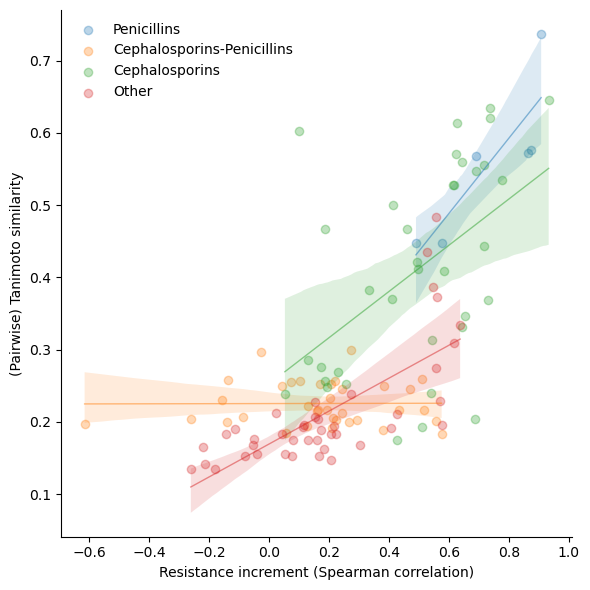

In [23]:
# plot 
sns.lmplot(data = df_unique, x = "mic", y = "tanimoto", hue = "pairwise", height=6,
        scatter_kws={'alpha':0.3}, line_kws={"alpha":0.5,"lw":1}, legend = False)
plt.ylabel("(Pairwise) Tanimoto similarity")
plt.xlabel("Resistance increment (Spearman correlation)")
plt.legend(loc = "best", frameon = False)

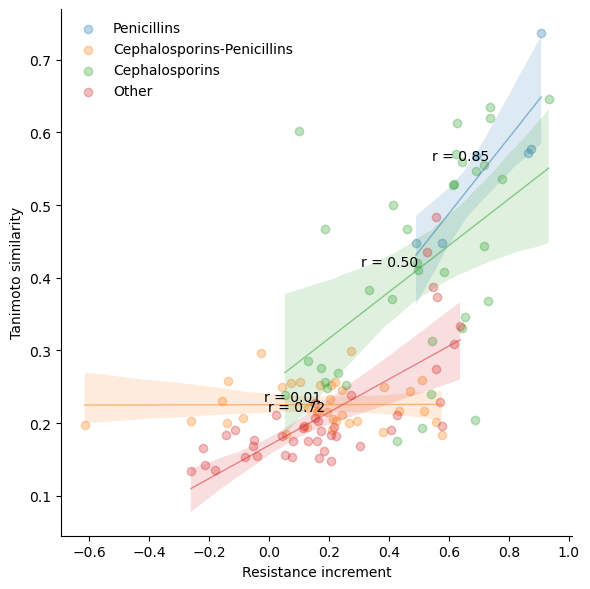

In [24]:
# calculate the correlation values
corr = df_unique.groupby("pairwise").corr().loc[(slice(None), "mic"), "tanimoto"]
corr = corr.reset_index()

# plot
g = sns.lmplot(data=df_unique, x="mic", y="tanimoto", hue="pairwise", height=6,
               scatter_kws={'alpha': 0.3}, line_kws={"alpha": 0.5, "lw": 1}, legend=False)

# add correlation values
for index, row in corr.iterrows():
    pairwise = row["pairwise"]
    corr_value = row["tanimoto"]
    x_pos = df_unique.loc[df_unique["pairwise"] == pairwise, "mic"].mean()
    y_pos = df_unique.loc[df_unique["pairwise"] == pairwise, "tanimoto"].mean()
    plt.annotate(f"r = {corr_value:.2f}", xy=(x_pos, y_pos), xytext=(x_pos, y_pos + 0.02), 
                 ha="right", va="top", fontsize=10)

plt.ylabel("Tanimoto similarity")
plt.xlabel("Resistance increment")
plt.legend(loc="best", frameon=False)
plt.show()

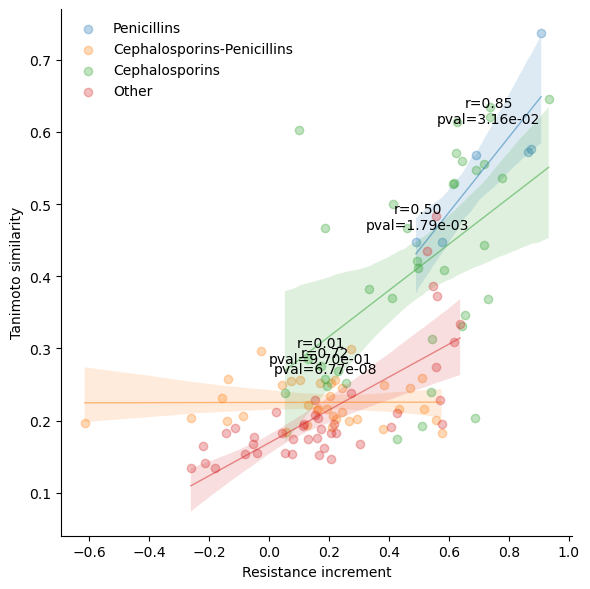

In [25]:

# calculate the correlation values and p-values
corr_pval = df_unique.groupby("pairwise").apply(lambda x: stats.pearsonr(x["mic"], x["tanimoto"]))
corr = corr_pval.apply(lambda x: x[0])
pval = corr_pval.apply(lambda x: x[1])
corr_pval = pd.concat([corr, pval], axis=1, keys=["corr", "pval"]).reset_index()

# plot
g = sns.lmplot(data=df_unique, x="mic", y="tanimoto", hue="pairwise", height=6,
               scatter_kws={'alpha': 0.3}, line_kws={"alpha": 0.5, "lw": 1}, legend=False)

# add correlation and p-value values
for index, row in corr_pval.iterrows():
    pairwise = row["pairwise"]
    corr_value = row["corr"]
    pval_value = row["pval"]
    x_pos = df_unique.loc[df_unique["pairwise"] == pairwise, "mic"].mean()
    y_pos = df_unique.loc[df_unique["pairwise"] == pairwise, "tanimoto"].mean()
    plt.annotate(f"r={corr_value:.2f}\npval={pval_value:.2e}", xy=(x_pos, y_pos), 
                 xytext=(x_pos, y_pos + 0.05), ha="center", va="bottom", fontsize=10)

plt.ylabel("Tanimoto similarity")
plt.xlabel("Resistance increment")
plt.legend(loc="best", frameon=False)
plt.show()


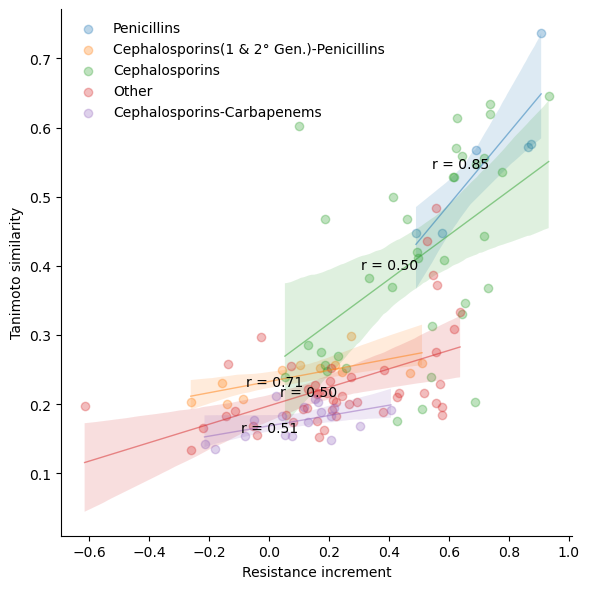

In [47]:
df_unique2 = df_unique.copy()

# label pairs
# set anti names
peni2 = ['Ampicillin', 'Ticarcillin','Piperacillin','Amoxicillin']
mono2 = ['Aztreonam']
carba2 = ['Meropenem', 'Imipenem']
ceph_12g = ['Cephalothin','Cefuroxime','Cefoxitin']
ceph2 = ['Ceftriaxone', 'Cephalothin','Cefuroxime','Cefpirome','Cefoxitin','Cefotaxime','Moxalactam', 'Ceftazidime','Cefepime']


# set condition for labels
filters = [
    # peni
    df_unique2["pair1"].isin(peni2) & df_unique2["pair2"].isin(peni2),
    df_unique2["pair2"].isin(peni2) & df_unique2["pair1"].isin(peni2),
    
    # ceph
    df_unique2["pair1"].isin(ceph2) & df_unique2["pair2"].isin(ceph2),
    df_unique2["pair2"].isin(ceph2) & df_unique2["pair1"].isin(ceph2),
    
    # ceph-peni
    df_unique2["pair1"].isin(ceph_12g) & df_unique2["pair2"].isin(peni2),
    df_unique2["pair2"].isin(ceph_12g) & df_unique2["pair1"].isin(peni2),
    # ceph-carba
     df_unique2["pair1"].isin(carba2) & df_unique2["pair2"].isin(ceph2)
]
values = [
    "Penicillins","Penicillins",
    "Cephalosporins","Cephalosporins", 
    "Cephalosporins(1 & 2° Gen.)-Penicillins","Cephalosporins(1 & 2° Gen.)-Penicillins",
          "Cephalosporins-Carbapenems"
         ]

# merge annots
df_unique2['pairwise'] = np.select(filters, values)
# replace 0 vals
df_unique2['pairwise'] = df_unique2['pairwise'].replace("0",'Other')


# calculate the correlation values
corr = df_unique2.groupby("pairwise").corr().loc[(slice(None), "mic"), "tanimoto"]
corr = corr.reset_index()

# plot
g = sns.lmplot(data=df_unique2, x="mic", y="tanimoto", hue="pairwise", height=6,
               scatter_kws={'alpha': 0.3}, line_kws={"alpha": 0.5, "lw": 1}, legend=False)

# add correlation values
for index, row in corr.iterrows():
    pairwise = row["pairwise"]
    corr_value = row["tanimoto"]
    x_pos = df_unique2.loc[df_unique2["pairwise"] == pairwise, "mic"].mean()
    y_pos = df_unique2.loc[df_unique2["pairwise"] == pairwise, "tanimoto"].mean()
    plt.annotate(f"r = {corr_value:.2f}", xy=(x_pos, y_pos), xytext=(x_pos, y_pos + 0.), 
                 ha="right", va="top", fontsize=10)

plt.ylabel("Tanimoto similarity")
plt.xlabel("Resistance increment")
plt.legend(loc="best", frameon=False)
plt.show()

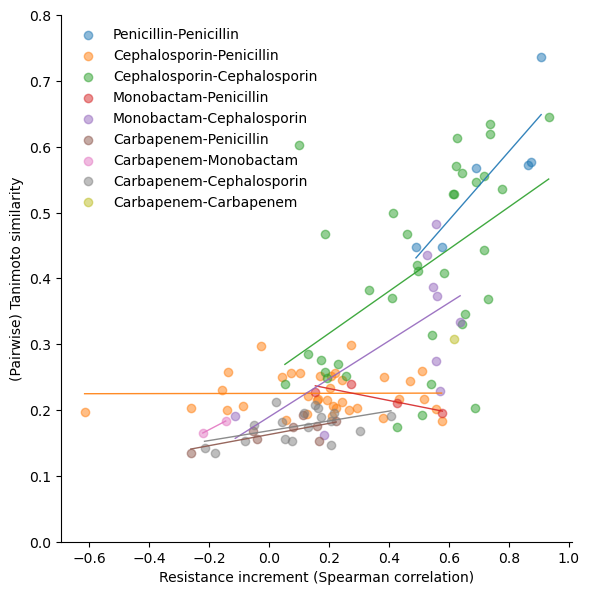

In [93]:
df_unique2['Pairwise'] = ''

for i, row in df_unique2.iterrows():
    pair1 = row['pair1']
    pair2 = row['pair2']
    categories = []

    if pair1 in peni:
        categories.append('Penicillin')
    if pair1 in ceph:
        categories.append('Cephalosporin')
    if pair1 in carba:
        categories.append('Carbapenem')
    if pair1 in mono:
        categories.append('Monobactam')

    if pair2 in peni:
        categories.append('Penicillin')
    if pair2 in ceph:
        categories.append('Cephalosporin')
    if pair2 in carba:
        categories.append('Carbapenem')
    if pair2 in mono:
        categories.append('Monobactam')

    if len(categories) > 0:
        new_value = '-'.join(categories)
        df_unique2.at[i, 'Pairwise'] = new_value

# df_unique2['Pairwise'].replace({
#     "Penicillin-Penicillin": "Penicillins", 
#     "Cephalosporin-Cephalosporin": "Cephalosporins",
#     "Carbapenem-Carbapenem": "Other",
#     "Carbapenem-Monobactam": "Other",
#     "Monobactam-Penicillin": "Other",
#     "Monobactam-Cephalosporin": "Other"
# }, 
#     inplace=True)
        
sns.lmplot(data = df_unique2, x = "mic", y = "tanimoto", hue = "Pairwise", height=6,ci=None,
        scatter_kws={'alpha':0.5}, line_kws={"alpha":0.9,"lw":1}, legend = False,
          )
plt.ylabel("(Pairwise) Tanimoto similarity")
plt.ylim(0,0.8)
plt.xlabel("Resistance increment (Spearman correlation)")
plt.legend(loc = "best", frameon = False)       

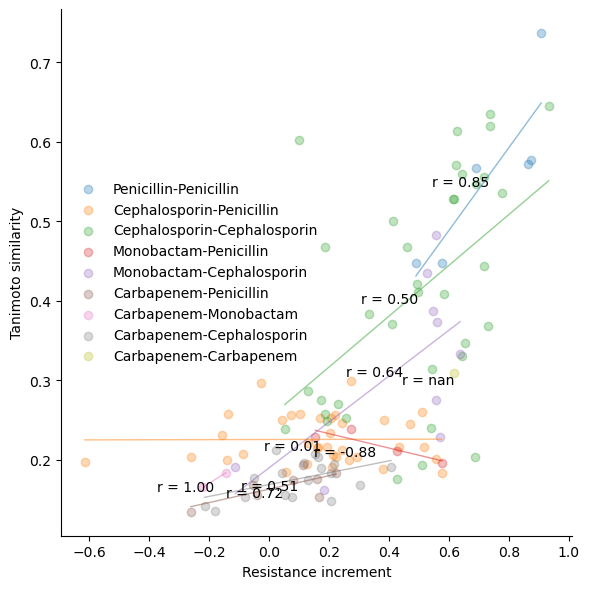

In [92]:
# calculate the correlation values
corr = df_unique2.groupby("Pairwise").corr().loc[(slice(None), "mic"), "tanimoto"]
corr = corr.reset_index()

# plot
g = sns.lmplot(data=df_unique2, x="mic", y="tanimoto", hue="Pairwise", height=6, ci=None,
               scatter_kws={'alpha': 0.3}, line_kws={"alpha": 0.5, "lw": 1}, legend=False)

# add correlation values
for index, row in corr.iterrows():
    Pairwise = row["Pairwise"]
    corr_value = row["tanimoto"]
    x_pos = df_unique2.loc[df_unique2["Pairwise"] == Pairwise, "mic"].mean()
    y_pos = df_unique2.loc[df_unique2["Pairwise"] == Pairwise, "tanimoto"].mean()
    plt.annotate(f"r = {corr_value:.2f}", xy=(x_pos, y_pos), xytext=(x_pos, y_pos + 0.), 
                 ha="right", va="top", fontsize=10)

plt.ylabel("Tanimoto similarity")
plt.xlabel("Resistance increment")
plt.legend(loc="best", frameon=False)
plt.show()

In [94]:
corr.round(2)

,Pairwise,level_1,tanimoto
0,Carbapenem-Carbapenem,mic,NaN
1,Carbapenem-Cephalosporin,mic,0.51
2,Carbapenem-Monobactam,mic,1.00
3,Carbapenem-Penicillin,mic,0.72
4,Cephalosporin-Cephalosporin,mic,0.50
5,Cephalosporin-Penicillin,mic,0.01
6,Monobactam-Cephalosporin,mic,0.64
7,Monobactam-Penicillin,mic,-0.88
8,Penicillin-Penicillin,mic,0.85


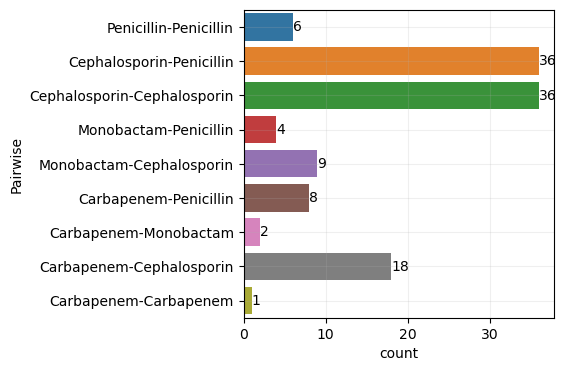

In [111]:
plt.figure(figsize=(4,4))
ax = sns.countplot(data=df_unique2, y="Pairwise", 
                   #order= pd.value_counts(df_unique2.Pairwise).index
                  )
plt.grid(alpha=0.2)
ax.bar_label(ax.containers[0]);

In [50]:
# check values based on p-vals
len(df_unique[df_unique.mic_pval > 0.05])

57

In [51]:
df_unique[df_unique.mic_pval <= 0.05]

,pair1,pair2,tanimoto,mic,mic_pval,pair_combined,pairwise
16,Ampicillin,Amoxicillin,0.736842,0.907407,1.849315e-03,"[Amoxicillin, Ampicillin]",Penicillins
32,Piperacillin,Amoxicillin,0.447368,0.490132,2.219791e-06,"[Amoxicillin, Piperacillin]",Penicillins
35,Piperacillin,Ampicillin,0.567308,0.689489,3.071643e-08,"[Ampicillin, Piperacillin]",Penicillins
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]",Penicillins
50,Ticarcillin,Piperacillin,0.447368,0.576357,1.186337e-08,"[Piperacillin, Ticarcillin]",Penicillins
...,...,...,...,...,...,...,...
234,Imipenem,Cefoxitin,0.190909,0.406786,4.205131e-07,"[Cefoxitin, Imipenem]",Other
237,Imipenem,Cefotaxime,0.203540,0.164418,2.921565e-02,"[Cefotaxime, Imipenem]",Other
246,Meropenem,Imipenem,0.308511,0.616525,6.700803e-12,"[Imipenem, Meropenem]",Other
250,Meropenem,Cefoxitin,0.168000,0.305150,7.765393e-03,"[Cefoxitin, Meropenem]",Other


In [52]:
df_unique.sort_values("mic_pval").head(10)

,pair1,pair2,tanimoto,mic,mic_pval,pair_combined,pairwise
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]",Penicillins
141,Ceftazidime,Cefotaxime,0.559322,0.642629,1.610741e-23,"[Cefotaxime, Ceftazidime]",Cephalosporins
187,Cefepime,Ceftazidime,0.528000,0.615216,3.857577e-18,"[Cefepime, Ceftazidime]",Cephalosporins
189,Cefepime,Cefotaxime,0.613208,0.625607,4.166798e-18,"[Cefepime, Cefotaxime]",Cephalosporins
157,Ceftriaxone,Cefotaxime,0.645455,0.932500,4.734858e-17,"[Cefotaxime, Ceftriaxone]",Cephalosporins
120,Cefotaxime,Cephalothin,0.555556,0.716436,7.606712e-17,"[Cefotaxime, Cephalothin]",Cephalosporins
219,Aztreonam,Ceftazidime,0.483051,0.557406,9.712729e-17,"[Aztreonam, Ceftazidime]",Other
210,Aztreonam,Piperacillin,0.195804,0.578073,4.962890e-14,"[Aztreonam, Piperacillin]",Other
221,Aztreonam,Cefotaxime,0.435185,0.527867,5.145336e-14,"[Aztreonam, Cefotaxime]",Other
222,Aztreonam,Cefepime,0.372881,0.560681,5.827643e-14,"[Aztreonam, Cefepime]",Other


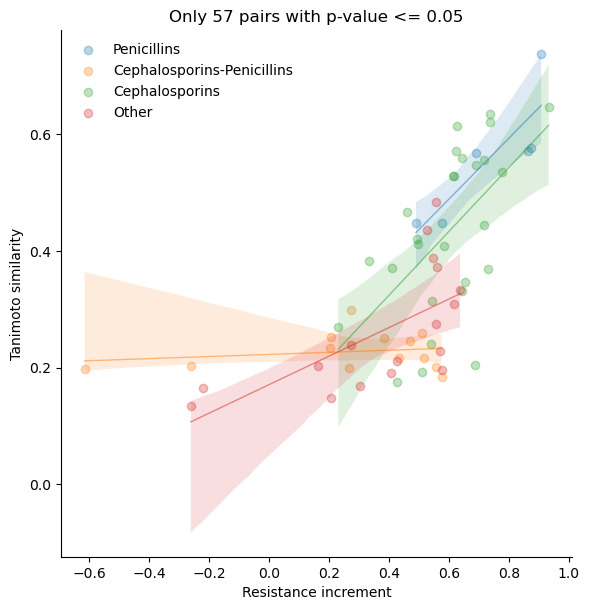

In [53]:
# plot 
sns.lmplot(data = df_unique[
    df_unique.mic_pval <= 0.05], x = "mic", y = "tanimoto", hue = "pairwise", 
           height=6, scatter_kws={'alpha':0.3}, line_kws={"alpha":0.5,"lw":1}, legend = False)
plt.ylabel("Tanimoto similarity")
plt.xlabel("Resistance increment")
plt.title("Only 57 pairs with p-value <= 0.05")
plt.legend(loc = "best", frameon = False)

In [54]:
df_unique[df_unique.pairwise == "Penicillins"]

,pair1,pair2,tanimoto,mic,mic_pval,pair_combined,pairwise
16,Ampicillin,Amoxicillin,0.736842,0.907407,1.849315e-03,"[Amoxicillin, Ampicillin]",Penicillins
32,Piperacillin,Amoxicillin,0.447368,0.490132,2.219791e-06,"[Amoxicillin, Piperacillin]",Penicillins
35,Piperacillin,Ampicillin,0.567308,0.689489,3.071643e-08,"[Ampicillin, Piperacillin]",Penicillins
48,Ticarcillin,Amoxicillin,0.576471,0.872485,1.020054e-24,"[Amoxicillin, Ticarcillin]",Penicillins
50,Ticarcillin,Piperacillin,0.447368,0.576357,1.186337e-08,"[Piperacillin, Ticarcillin]",Penicillins
51,Ticarcillin,Ampicillin,0.571429,0.862640,1.195218e-07,"[Ampicillin, Ticarcillin]",Penicillins


In [55]:
data_size = len(df_unique[df_unique.pairwise == "Cephalosporins"])
print(f"data size: {data_size}")
df_unique[df_unique.pairwise == "Cephalosporins"]

data size: 36


,pair1,pair2,tanimoto,mic,mic_pval,pair_combined,pairwise
88,Cefoxitin,Cephalothin,0.602151,0.101790,3.568737e-01,"[Cefoxitin, Cephalothin]",Cephalosporins
104,Cefuroxime,Cephalothin,0.535354,0.775907,1.580366e-09,"[Cefuroxime, Cephalothin]",Cephalosporins
106,Cefuroxime,Cefoxitin,0.467290,0.185815,1.828167e-01,"[Cefoxitin, Cefuroxime]",Cephalosporins
120,Cefotaxime,Cephalothin,0.555556,0.716436,7.606712e-17,"[Cefotaxime, Cephalothin]",Cephalosporins
121,Cefotaxime,Cefuroxime,0.620000,0.735556,1.460541e-11,"[Cefotaxime, Cefuroxime]",Cephalosporins
122,Cefotaxime,Cefoxitin,0.382609,0.332398,4.148749e-05,"[Cefotaxime, Cefoxitin]",Cephalosporins
136,Ceftazidime,Cephalothin,0.370079,0.411666,2.799462e-05,"[Ceftazidime, Cephalothin]",Cephalosporins
137,Ceftazidime,Cefuroxime,0.410853,0.496190,5.535189e-05,"[Ceftazidime, Cefuroxime]",Cephalosporins
138,Ceftazidime,Cefoxitin,0.269504,0.231494,4.236956e-03,"[Cefoxitin, Ceftazidime]",Cephalosporins
141,Ceftazidime,Cefotaxime,0.559322,0.642629,1.610741e-23,"[Cefotaxime, Ceftazidime]",Cephalosporins


In [56]:
# function plot
def plot_corr(df):
    
    """
    a function to plot the global correlation and calculate the spearman and pearson corrs
    """
    
    r, p = stats.pearsonr(df["mic"], df["tanimoto"])
    rs, ps = stats.spearmanr(df["mic"], df["tanimoto"])
    df_len = len(df)
    
    sns.lmplot(data=df,x="mic",y="tanimoto",height=6, 
        scatter_kws={"color": "black", 'alpha':0.2}, line_kws={"alpha":0.5,"lw":1})
    plt.title(f"Top {df_len} pairs \n Pearson = %.2f, p-val = %.2g \n Spearman = %.2f, p-val = %.2g" %(r,p,rs, ps), size=12)
    plt.ylabel("Tanimoto similarity")
    plt.xlabel("Resistance increment")

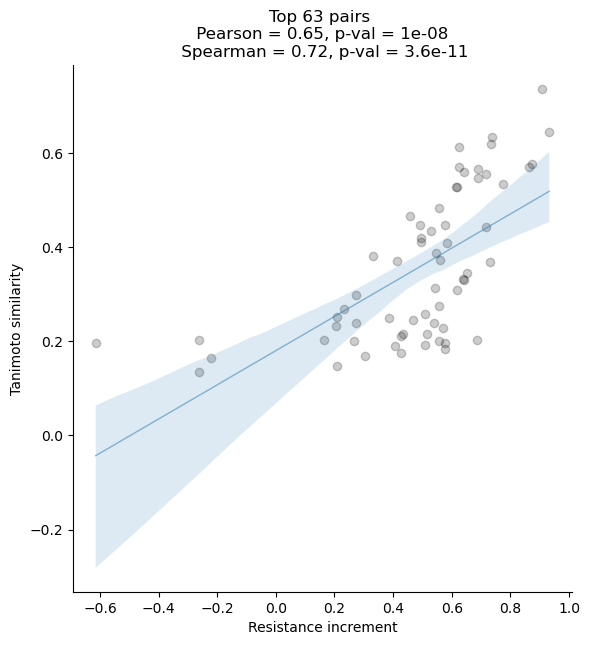

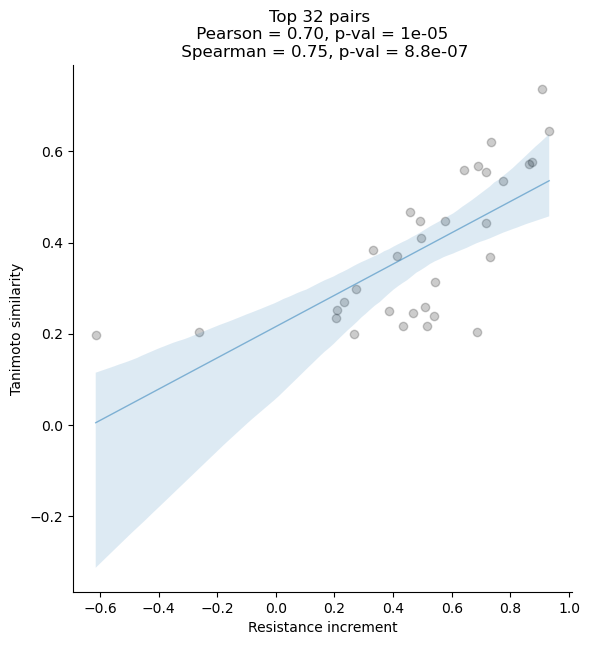

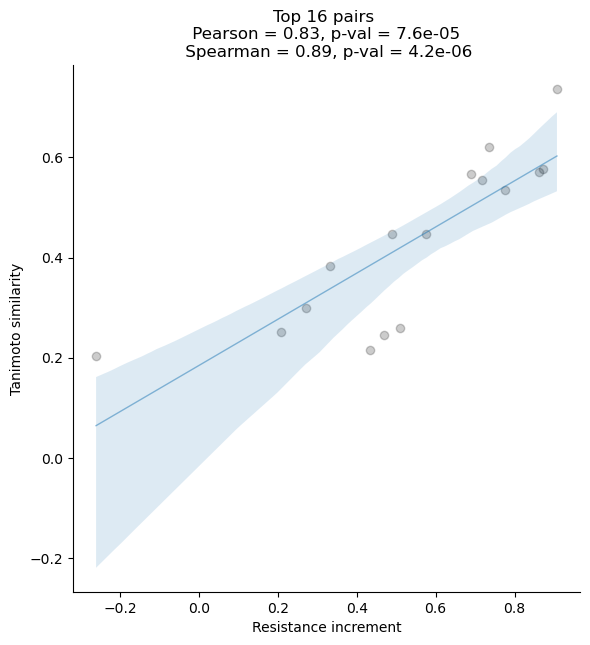

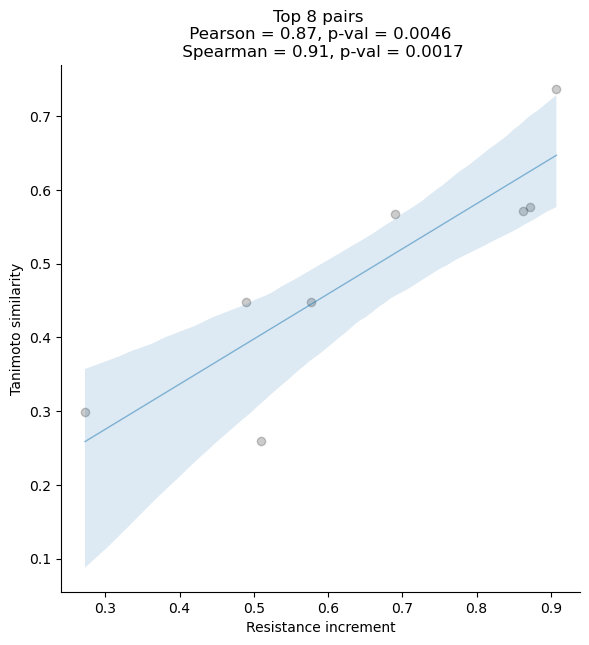

In [57]:
# plots only with data with p-vals less than 0.5
plot_corr(df_unique[df_unique.mic_pval <= 0.05])
plot_corr(df_unique[df_unique.mic_pval <= 0.05].head(32))
plot_corr(df_unique[df_unique.mic_pval <= 0.05].head(16))
plot_corr(df_unique[df_unique.mic_pval <= 0.05].head(8))

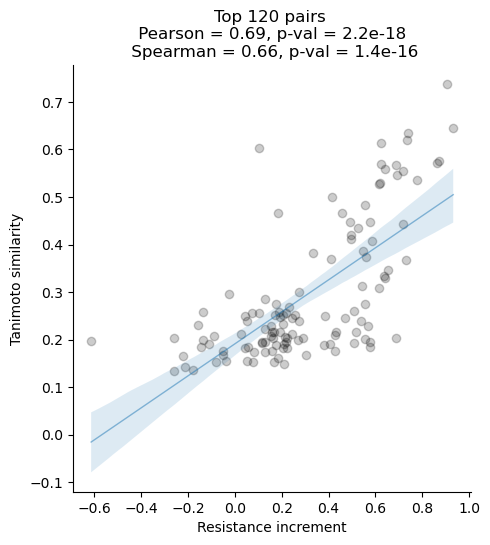

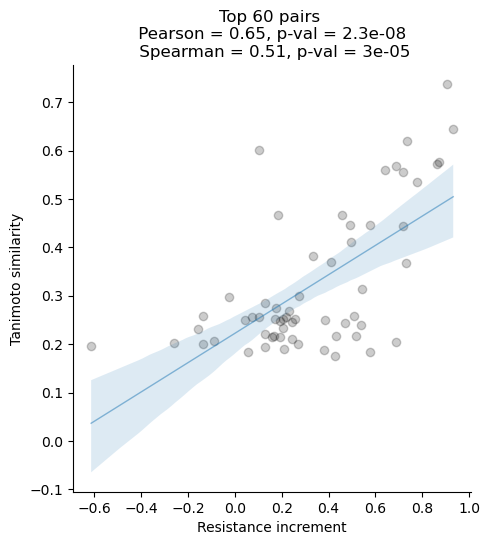

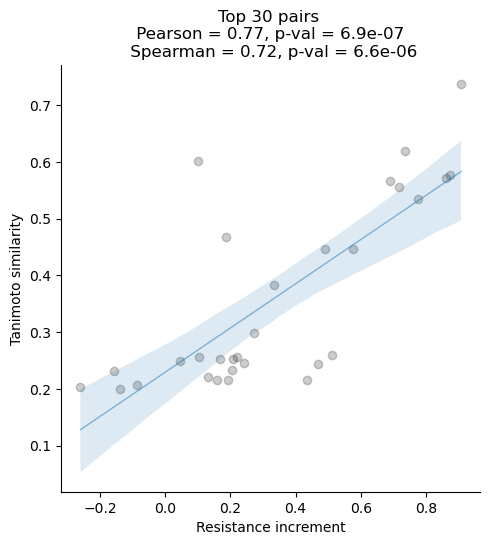

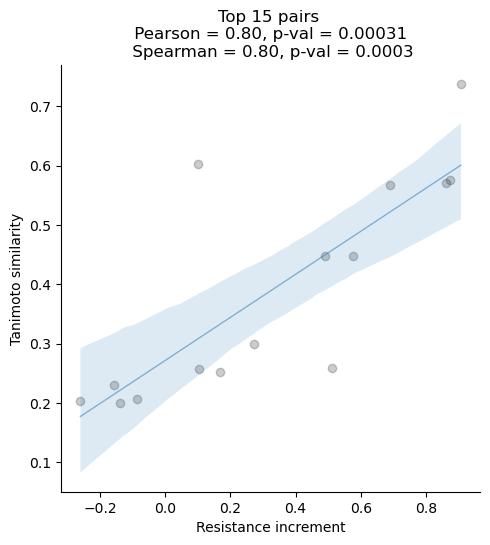

In [64]:
# plots for all 120 points 
plot_corr(df_unique)
plot_corr(df_unique.head(60))
plot_corr(df_unique.head(30))
plot_corr(df_unique.head(15))

In [65]:
df_unique.pairwise.unique()

array(['Penicillins', 'Cephalosporins-Penicillins', 'Cephalosporins',
       'Other'], dtype=object)

In [66]:
# filter dsets by antibiotic classes
df_peni_corr  = df_unique[df_unique.pairwise == "Penicillins"]
df_ceph_corr  = df_unique[df_unique.pairwise == "Cephalosporins"]
df_ceph_peni_corr  = df_unique[df_unique.pairwise == "Cephalosporins-Penicillins"]
df_other_corr = df_unique[df_unique.pairwise == "Other"]

In [68]:
def plot_corr_anticlass(df, anti, color):
    r, p = stats.pearsonr(df["mic"], df["tanimoto"])
    rs, ps = stats.spearmanr(df["mic"], df["tanimoto"])
    df_len = len(df)
    
    sns.lmplot(data=df, x="mic", y="tanimoto", height=5, 
        scatter_kws={"color": "black", 'alpha':0.3}, line_kws={'color': color})
    plt.title(f" {anti} | {df_len} pairs \n Pearson = %.2f, p-val = %.2g \n Spearman = %.2f, p-val = %.2g" %(r,p,rs, ps), size=12)

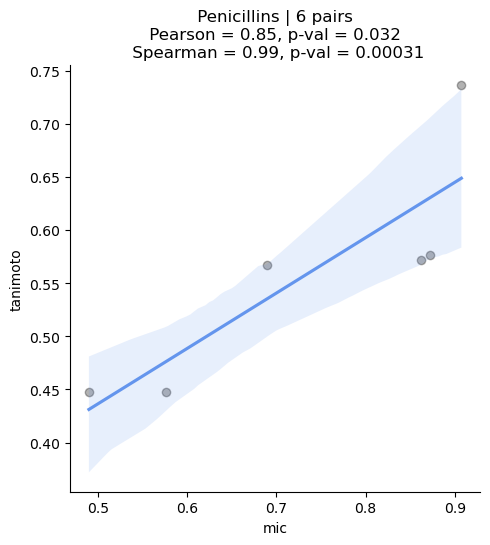

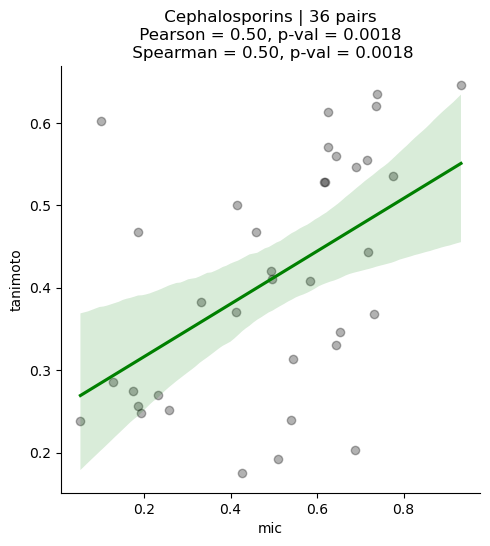

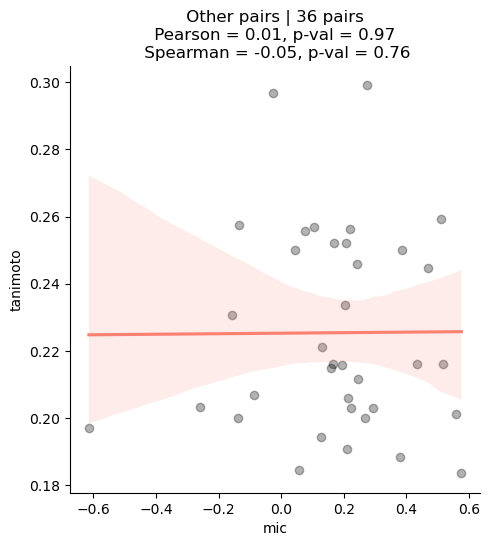

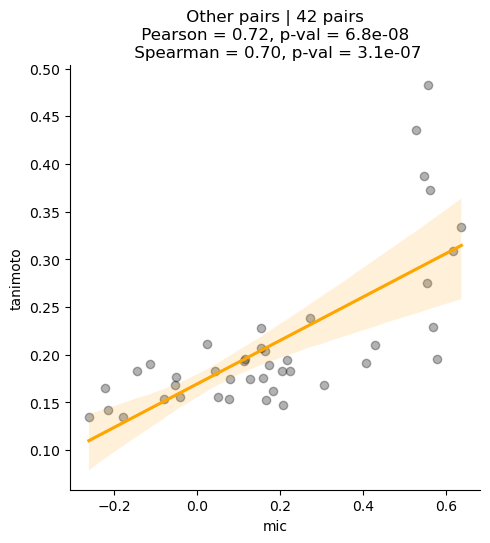

In [69]:
plot_corr_anticlass(df_peni_corr, "Penicillins", "cornflowerblue")
plot_corr_anticlass(df_ceph_corr, "Cephalosporins", "green")
plot_corr_anticlass(df_ceph_peni_corr, "Other pairs", "salmon")
plot_corr_anticlass(df_other_corr, "Other pairs", "orange")

# Kinetics (old)

In [107]:
df_kins = pd.read_pickle("../results/kinetics/training_dset_kinetics.pkl")

# filter and log transform
df_kins = df_kins[df_kins.catalytic_efficiency > 0]
df_kins["log_catalytic_efficiency"] = np.log(df_kins.catalytic_efficiency)
df_kins = df_kins.sort_values("antibiotic_class")

# subsets by bla class
df_kins_a = df_kins[df_kins.bla_class.str.contains("Class A")]
df_kins_b = df_kins[df_kins.bla_class.str.contains("Class B")]
df_kins_c = df_kins[df_kins.bla_class.str.contains("Class C")]
df_kins_d = df_kins[df_kins.bla_class.str.contains("Class D")]
df_kins_sbl = df_kins[df_kins.bla_class.str.contains("Class A|Class C|Class D")]

df_kins.columns

Index(['protein_name', 'antibiotic', 'antibiotic_class', 'kcat', 'km',
       'catalytic_efficiency', '#name', 'seq', 'length', 'filename',
       'protein_family', 'bla_class', 'bla_subclass', 'protein_family_header',
       'seq_id', 'molecular_weight', 'aromaticity', 'instability', 'gravy',
       'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet',
       'is_clust90_rep', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order',
       'Family', 'Genus', 'Species', 'predicted_signal_peptide',
       'Other_sigpept', 'SP(Sec/SPI)', 'LIPO(Sec/SPII)', 'TAT(Tat/SPI)',
       'TATLIPO(Sec/SPII)', 'PILIN(Sec/SPIII)', 'CS Position',
       'seq_without_sigpept', 'esm1b', 'esm', 'onehot', 't5xlu50', 't5bfd',
       'xlnet', 'bepler', 'carp640M', 'carp640M_logp',
       'log_catalytic_efficiency'],
      dtype='object')

In [108]:
# kcat (turnover number): convertion of E to P (velocidad de reaccion pues)
# km afinidad de sustrato
# Se espera un valor alto de kcat y un valor bajo de Km para los mejores sustratos 
df_kins[['protein_name', 'antibiotic','kcat', 'km','catalytic_efficiency', "log_catalytic_efficiency"]].sort_values("catalytic_efficiency")

,protein_name,antibiotic,kcat,km,catalytic_efficiency,log_catalytic_efficiency
750,OXA-229,Meropenem,0.01,0.03,0.00001,-11.512925
685,ACC-2,Amoxicillin,0.20,1.00,0.00020,-8.517193
834,OXA-60,Cephaloridine,0.50,1000.00,0.00050,-7.600902
554,IND-2a,Cefepime,1.00,2200.00,0.00100,-6.907755
826,OXA-58,Meropenem,0.01,0.08,0.00150,-6.502290
...,...,...,...,...,...,...
777,OXA-32,Amoxicillin,1.50,220.00,70.00000,4.248495
776,OXA-32,Benzylpenicillin,3.50,45.00,80.00000,4.382027
664,CMY-36,Nitrocefine,910.00,7.30,125.00000,4.828314
150,SHV-72,Amoxicillin,5876.00,26.00,226.00000,5.420535


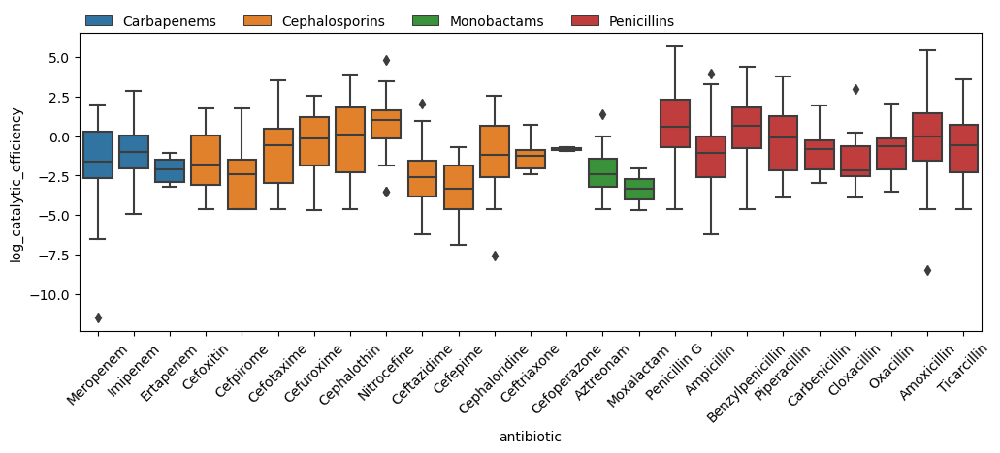

In [109]:
plt.figure(figsize=(12,4))
sns.boxplot(data = df_kins, x = "antibiotic", y = "log_catalytic_efficiency", hue = "antibiotic_class", dodge=False)
plt.legend(ncol = 4,  loc=(0,1), borderaxespad=0, frameon = False)
plt.xticks(rotation=45);

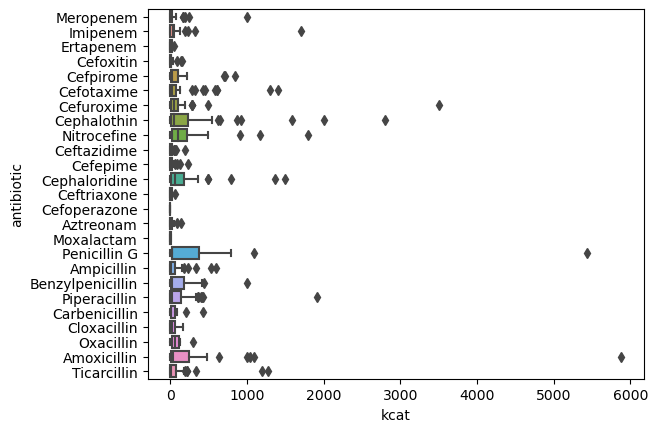

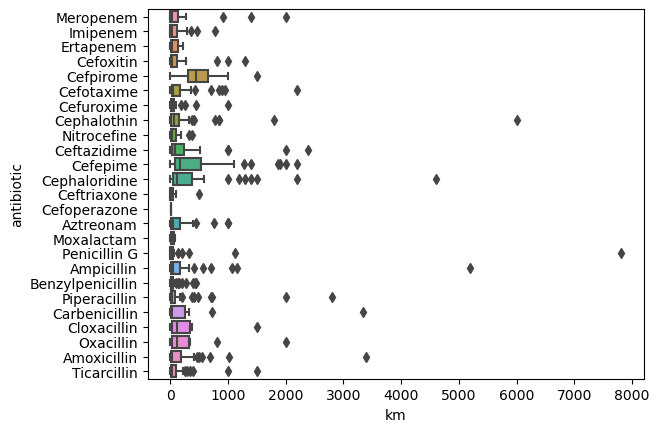

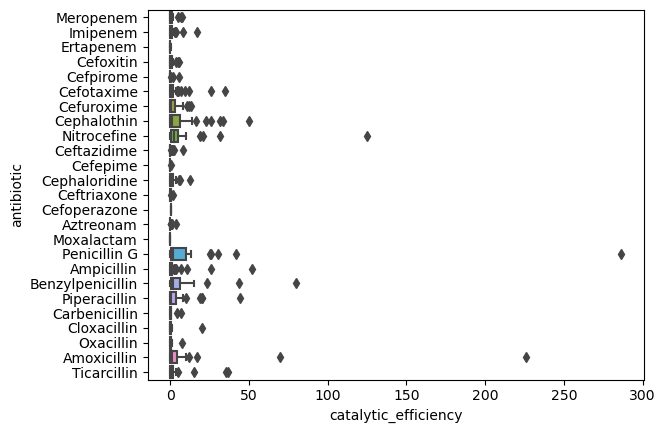

In [110]:
sns.boxplot(data = df_kins, y = "antibiotic", x = "kcat")
plt.show()
sns.boxplot(data = df_kins, y = "antibiotic", x = "km")
plt.show()
sns.boxplot(data = df_kins, y = "antibiotic", x = "catalytic_efficiency")
plt.show()

In [111]:
# het a subset
df_kins_sub = df_kins[["protein_name", "antibiotic", "antibiotic_class", "bla_class"]]
# group by counts
subset_grouped_kins = df_kins_sub.groupby(["bla_class", "antibiotic_class", "antibiotic"]).count()

In [112]:
# https://coderzcolumn.com/tutorials/data-science/how-to-plot-sankey-diagram-in-python-jupyter-notebook-holoviews-and-plotly 
fig = hv.Sankey(subset_grouped_kins, kdims=["bla_class", "antibiotic_class"], vdims=["protein_name"])
fig.opts(
    cmap='Pastel1',label_position='outer', edge_color='bla_class', 
    edge_line_width=0, node_width=50, width=800, height=600, bgcolor="white", 
    title="Antibiotic classes contained in each betalactamase class")

:Sankey   [bla_class,antibiotic_class]   (protein_name)

In [113]:
# https://coderzcolumn.com/tutorials/data-science/how-to-plot-sankey-diagram-in-python-jupyter-notebook-holoviews-and-plotly 
fig = hv.Sankey(subset_grouped_kins, kdims=["antibiotic_class", "antibiotic"], vdims=["protein_name"])
fig.opts(
    cmap='Pastel1',label_position='outer', edge_color='antibiotic_class', 
    edge_line_width=0, node_width=50, width=800, height=600, bgcolor="white", 
    title="Antibiotic contained in each antibiotic class")

:Sankey   [antibiotic_class,antibiotic]   (protein_name)

Fin 